In [1]:
!pip install pandas googletrans==4.0.0-rc1 psycopg2-binary sqlalchemy textblob scikit-learn matplotlib seaborn

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/1.2 MB ? eta -:--:--
   ---------------------------------------- 1.2/1.2 MB 14.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/626.3 kB ? eta -:--:--
   --------------------------------------- 626.3/626.3 kB 11.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   ---------------------------------------- 1.3/1.3 MB 16.8 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17457 sha256=5e0c077f5b34386e19fa66aaad3a0b7a438346aa93362015709aa49152869aaa
  Stored in directory: c:\users\yi_xu\appdata\local\pip\cache\wheels\95\0f\04\b17a72024b56a60e499ce1a6313d283ed5ba332407155bee03
Successfully built googletrans
  Attempting uninstall: h11
    Found existing installation: h11 0.14.0
    Uninstalling h11-0.14.0:
      Successfully uninstalled 

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab 4.2.5 requires httpx>=0.25.0, but you have httpx 0.13.3 which is incompatible.


In [2]:
!pip install textblob

In [1]:
import pandas as pd
import unicodedata
from googletrans import Translator
import time

### Extracting of Data

In [2]:
customers_df = pd.read_csv('data/olist_customers_dataset.csv')
customers_df

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [3]:
geolocation_df = pd.read_csv('data/olist_geolocation_dataset.csv')
geolocation_df

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


In [4]:
order_items_df = pd.read_csv('data/olist_order_items_dataset.csv')
order_items_df

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [5]:
order_payments_df = pd.read_csv('data/olist_order_payments_dataset.csv', encoding='utf-8')
order_payments_df

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [6]:
orders_df = pd.read_csv('data/olist_orders_dataset.csv', encoding='utf-8')
orders_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


In [7]:
products_df = pd.read_csv('data/olist_products_dataset.csv', encoding='utf-8')
products_df

,product_id,product_category_name,product_name_length,product_description_length,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [8]:
sellers_df = pd.read_csv('data/olist_sellers_dataset.csv', encoding='utf-8')
sellers_df

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


In [9]:
product_category_translation_df = pd.read_csv('data/product_category_name_translation.csv', encoding='utf-8')
product_category_translation_df

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


In [10]:
# Load dataset
order_review_df = pd.read_csv('data/olist_order_reviews_dataset.csv', encoding='utf-8')
order_review_df

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


### Translating review comments to english 

In [1]:
# Initialize translator
translator = Translator()

#Transformation
# Normalize text function
def normalize_text(text):
    if pd.notnull(text):
        return unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8')
    return text

# Translation function with debug and delay
def translate_to_english(text):
    try:
        if pd.notnull(text):
            # time.sleep(0.5)  # Prevent throttling
            translated = translator.translate(text, src="pt", dest="en").text
            print(f"Original: {text}\nTranslated: {translated}")
            return translated
        return text
    except Exception as e:
        print(f"Translation failed for '{text}': {e}")
        return text



# Apply Normalization to text columns
order_review_df['review_comment_title_normalized'] = order_review_df['review_comment_title'].apply(normalize_text)
order_review_df['review_comment_message_normalized'] = order_review_df['review_comment_message'].apply(normalize_text)

# Replace missing values (NaN) with 'NA'
order_review_df['review_comment_title_normalized'] = order_review_df['review_comment_title_normalized'].fillna('NA')
order_review_df['review_comment_message_normalized'] = order_review_df['review_comment_message_normalized'].fillna('NA')

# Drop rows where 'NA' is present in either column
order_review_df = order_review_df[
    (order_review_df['review_comment_title_normalized'] != 'NA') &
    (order_review_df['review_comment_message_normalized'] != 'NA')
]

# Print DataFrame info to confirm missing values are handled
print(order_review_df.info())

# Translate text columns
order_review_df['review_comment_title_translated'] = order_review_df['review_comment_title_normalized'].apply(translate_to_english)
order_review_df['review_comment_message_translated'] = order_review_df['review_comment_message_normalized'].apply(translate_to_english)

# Drop rows where translation failed
order_review_df = order_review_df[
    (order_review_df['review_comment_title_translated'] != 'TRANSLATION_FAILED') &
    (order_review_df['review_comment_message_translated'] != 'TRANSLATION_FAILED')
]


# Save translated dataset
output_path = "data/translated_reviews_dataset.csv"
order_review_df.to_csv(output_path, index=False, encoding='utf-8')

print(f"Translation complete! Translated file saved to {output_path}.")

print(order_review_df.head())

<class 'pandas.core.frame.DataFrame'>
Index: 9839 entries, 9 to 99200
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   review_id                          9839 non-null   object
 1   order_id                           9839 non-null   object
 2   review_score                       9839 non-null   int64 
 3   review_comment_title               9839 non-null   object
 4   review_comment_message             9839 non-null   object
 5   review_creation_date               9839 non-null   object
 6   review_answer_timestamp            9839 non-null   object
 7   review_comment_title_normalized    9839 non-null   object
 8   review_comment_message_normalized  9839 non-null   object
dtypes: int64(1), object(8)
memory usage: 768.7+ KB
None
Original: recomendo
Translated: recommend
Original: Super recomendo
Translated: Super recommend
Original: Nao chegou meu produto 
Translated: My pro

In [11]:
# Extraction of dataset
translated_review_df = pd.read_csv('data/translated_reviews_dataset.csv', encoding='utf-8')
translated_review_df

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_comment_title_normalized,review_comment_message_normalized,review_comment_title_translated,review_comment_message_translated
0,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,recomendo,aparelho eficiente. no site a marca do aparelh...,2018-05-22 00:00:00,2018-05-23 16:45:47,recomendo,aparelho eficiente. no site a marca do aparelh...,recommend,Efficient apparatus.On the site the brand of t...
1,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,Super recomendo,"Vendedor confiável, produto ok e entrega antes...",2018-05-23 00:00:00,2018-05-24 03:00:01,Super recomendo,"Vendedor confiavel, produto ok e entrega antes...",Super recommend,"TRUST SELLER, PRODUCT OK AND DELIVERS BEFORE T..."
2,373cbeecea8286a2b66c97b1b157ec46,583174fbe37d3d5f0d6661be3aad1786,1,Não chegou meu produto,Péssimo,2018-08-15 00:00:00,2018-08-15 04:10:37,Nao chegou meu produto,Pessimo,My product did not arrive,Pessimal
3,d21bbc789670eab777d27372ab9094cc,4fc44d78867142c627497b60a7e0228a,5,Ótimo,Loja nota 10,2018-07-10 00:00:00,2018-07-11 14:10:25,Otimo,Loja nota 10,Excellent,NOTE 10 STORE
4,c92cdd7dd544a01aa35137f901669cdf,37e7875cdce5a9e5b3a692971f370151,4,Muito bom.,Recebi exatamente o que esperava. As demais en...,2018-06-07 00:00:00,2018-06-09 18:44:02,Muito bom.,Recebi exatamente o que esperava. As demais en...,Very good.,I received exactly what I expected.The other o...
...,...,...,...,...,...,...,...,...,...,...,...
9834,47e0954e156dac6512c25c6d2ecc1c66,16cbf959cfdb88c47ee2a29303547ec2,5,Nota máxima!,"Muito obrigado,\r\n\r\nExcelente atendimento,b...",2018-05-22 00:00:00,2018-05-23 00:51:43,Nota maxima!,"Muito obrigado,\r\n\r\nExcelente atendimento,b...",NOTE MAXIMA!,"Thank you very much,\r\n\r\nExcellent service,..."
9835,0e7bc73fde6782891898ea71443f9904,bd78f91afbb1ecbc6124974c5e813043,4,👍,Aprovado!,2018-07-04 00:00:00,2018-07-05 00:25:13,NaN,Aprovado!,NaN,Approved!
9836,58be140ccdc12e8908ff7fd2ba5c7cb0,0ebf8e35b9807ee2d717922d5663ccdb,5,muito bom produto,"Ficamos muito satisfeitos com o produto, atend...",2018-06-30 00:00:00,2018-07-02 23:09:35,muito bom produto,"Ficamos muito satisfeitos com o produto, atend...",very good product,"We are very pleased with the product, meets ou..."
9837,51de4e06a6b701cb2be47ea0e689437b,b7467ae483dbe956fe9acdf0b1e6e3f4,3,Não foi entregue o pedido,Bom dia \r\nDas 6 unidades compradas só recebi...,2018-06-05 00:00:00,2018-06-06 10:52:19,Nao foi entregue o pedido,Bom dia \r\nDas 6 unidades compradas so recebi...,The order was not delivered,Good morning \r\nOf the 6 units purchased I on...


### Schema Diagram

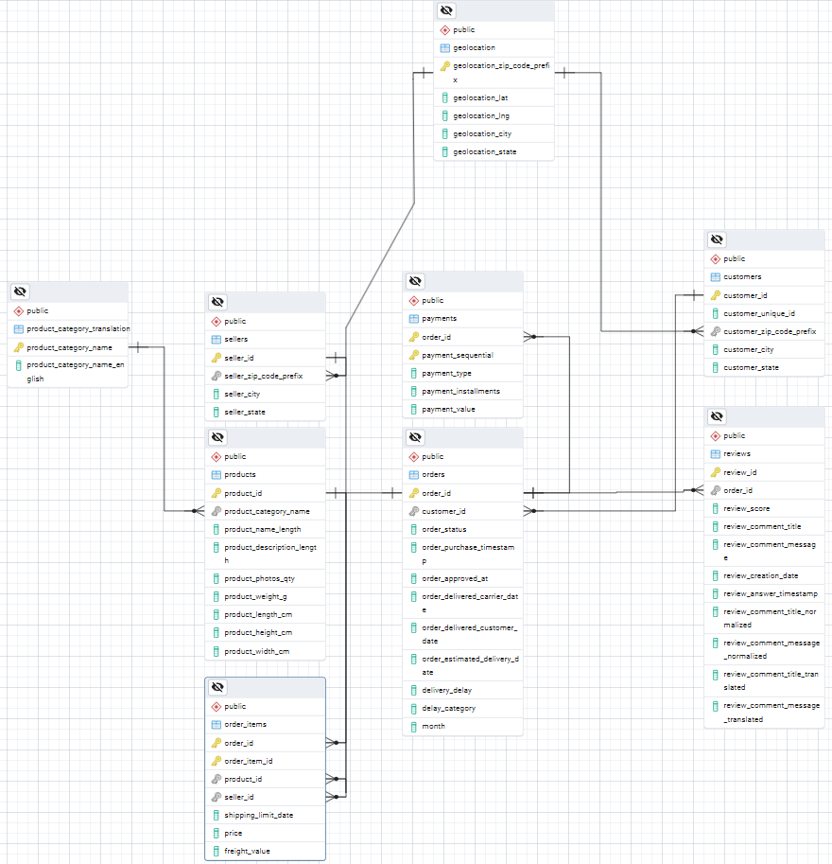


### Creating of DataBase

In [1]:
import psycopg2
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT


# RDS Database configuration
rds_config = {
    'user': 'postgres',             #  RDS username
    'password': 'awsadmin123',            #  RDS password
    'host': 'database-1.c542a8k42p01.ap-southeast-1.rds.amazonaws.com',  #  RDS endpoint
    'port': '5432',                 # Default PostgreSQL port
    'database': 'e_commerce_olist'        # Database name
}



create_table_queries = [
    """
    DROP TABLE IF EXISTS geolocation;
    CREATE TABLE geolocation (
        geolocation_zip_code_prefix INT,
        geolocation_lat FLOAT NOT NULL,
        geolocation_lng FLOAT NOT NULL,
        geolocation_city VARCHAR(50) NOT NULL,
        geolocation_state CHAR(2) NOT NULL,
        PRIMARY KEY (geolocation_zip_code_prefix)
    );
    """,

    """
    DROP TABLE IF EXISTS customers;
    CREATE TABLE customers (
        customer_id VARCHAR(50),
        customer_unique_id VARCHAR(50) NOT NULL,
        customer_zip_code_prefix INT,
        customer_city VARCHAR(50),
        customer_state CHAR(2),
        PRIMARY KEY (customer_id)
    );
    """,

    """
    DROP TABLE IF EXISTS sellers;
    CREATE TABLE sellers (
        seller_id VARCHAR(50),
        seller_zip_code_prefix INT NOT NULL,
        seller_city VARCHAR(50),
        seller_state CHAR(2),
        PRIMARY KEY (seller_id)
    );
    """,

    """
    DROP TABLE IF EXISTS product_category_translation;
    CREATE TABLE product_category_translation (
        product_category_name VARCHAR(50),
        product_category_name_english VARCHAR(50) NOT NULL,
        PRIMARY KEY (product_category_name)
    );
    """,

    """
    DROP TABLE IF EXISTS products;
    CREATE TABLE products (
        product_id VARCHAR(50),
        product_category_name VARCHAR(50),
        product_name_length INT,
        product_description_length INT,
        product_photos_qty INT,
        product_weight_g INT,
        product_length_cm INT,
        product_height_cm INT,
        product_width_cm INT,
        PRIMARY KEY (product_id)
    );
    """,

    """
    DROP TABLE IF EXISTS orders;
    CREATE TABLE orders (
        order_id VARCHAR(50),
        customer_id VARCHAR(50) NOT NULL,
        order_status VARCHAR(50),
        order_purchase_timestamp TIMESTAMP,
        order_approved_at TIMESTAMP,
        order_delivered_carrier_date TIMESTAMP,
        order_delivered_customer_date TIMESTAMP,
        order_estimated_delivery_date TIMESTAMP,
        delivery_delay INT,
        delay_category VARCHAR(20),
        month VARCHAR(7),
        PRIMARY KEY (order_id)
    );
    """,

    """
    DROP TABLE IF EXISTS order_items;
    CREATE TABLE order_items (
        order_id VARCHAR(50),
        order_item_id INT,
        product_id VARCHAR(50),
        seller_id VARCHAR(50),
        shipping_limit_date TIMESTAMP,
        price DECIMAL(10,2),
        freight_value DECIMAL(10,2),
        PRIMARY KEY (order_id, order_item_id)
    );
    """,

    """
    DROP TABLE IF EXISTS reviews;
    CREATE TABLE reviews (
        review_id VARCHAR(50),
        order_id VARCHAR(50),
        review_score INT,
        review_comment_title TEXT,
        review_comment_message TEXT,
        review_creation_date TIMESTAMP,
        review_answer_timestamp TIMESTAMP,
        review_comment_title_normalized TEXT,
        review_comment_message_normalized TEXT,
        review_comment_title_translated TEXT,
        review_comment_message_translated TEXT,
        PRIMARY KEY (review_id)
    );
    """,

    """
    DROP TABLE IF EXISTS payments;
    CREATE TABLE payments (
        order_id VARCHAR(50),
        payment_sequential INT,
        payment_type VARCHAR(50) NOT NULL,
        payment_installments INT,
        payment_value DECIMAL(10,2),
        PRIMARY KEY (order_id, payment_sequential)
    );
    """
]


# Connect to the RDS database
try:
    print("Connecting to RDS database...")
    conn = psycopg2.connect(**rds_config)
    conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)
    print("Connection to RDS database successful.")
except Exception as e:
    print(f"Failed to connect to RDS database: {e}")
    exit()

# Create tables in the RDS database
try:
    cur = conn.cursor()
    for query in create_table_queries:
        cur.execute(query)
        print("Table created successfully.")
    cur.close()
    print("All tables created.")
except Exception as e:
    print(f"Failed to create tables: {e}")
    conn.close()
    exit()



Connecting to RDS database...
Connection to RDS database successful.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
Table created successfully.
All tables created.


### Transformation & Loading of Data

In [2]:
import pandas as pd
from sqlalchemy import create_engine
from sqlalchemy import text


# Create SQLAlchemy engine with the RDS database name
connection_string = f"postgresql://{rds_config['user']}:{rds_config['password']}@{rds_config['host']}:{rds_config['port']}/{rds_config['database']}"
engine = create_engine(connection_string)

# Data loading function
def load_data():

    # Load geolocation
    print("Loading geolocation data...")
    df_geo = pd.read_csv('data/olist_geolocation_dataset.csv')
    # Clean data and handle duplicates
    df_geo[['geolocation_city', 'geolocation_state']] = df_geo[['geolocation_city', 'geolocation_state']].apply(lambda x: x.str.strip())
    df_geo_cleaned = df_geo.groupby('geolocation_zip_code_prefix').agg({
        'geolocation_lat': 'mean',
        'geolocation_lng': 'mean',
        'geolocation_city': lambda x: x.value_counts().index[0],
        'geolocation_state': lambda x: x.value_counts().index[0]
    }).reset_index()
    # Basic validation
    assert df_geo_cleaned['geolocation_state'].nunique() > 1, "Error: Only one state found"
    # Load to database
    df_geo_cleaned.to_sql('geolocation', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_geo_cleaned)} geolocation records")
    # Verify state distribution
    with engine.connect() as conn:
        result = conn.execute(text("""
            SELECT geolocation_state, COUNT(*) as count
            FROM geolocation
            GROUP BY geolocation_state
            ORDER BY count DESC;
        """)).fetchall()
    print("\nState distribution in database:")
    for state, count in result:
        print(f"{state}: {count}")

    # Load product categories
    print("Loading product categories...")
    df_cat = pd.read_csv('data/product_category_name_translation.csv')
    df_cat.to_sql('product_category_translation', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_cat)} product categories")

    # Load products (excluding null categories)
    print("Loading products...")
    df_prod = pd.read_csv('data/olist_products_dataset.csv')
    df_prod = df_prod.dropna(subset=['product_category_name'])
    # Convert numeric columns to appropriate types
    numeric_cols = ['product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']
    df_prod[numeric_cols] = df_prod[numeric_cols].apply(pd.to_numeric, errors='coerce')
    df_prod.to_sql('products', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_prod)} products")

    # Load customers
    print("Loading customers...")
    df_cust = pd.read_csv('data/olist_customers_dataset.csv')
    df_cust = df_cust.dropna()  # Remove any rows with missing values
    df_cust.to_sql('customers', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_cust)} customers")

    # Load sellers
    print("Loading sellers...")
    df_sell = pd.read_csv('data/olist_sellers_dataset.csv')
    df_sell = df_sell.dropna()  # Remove any rows with missing values
    df_sell.to_sql('sellers', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_sell)} sellers")

    # Load orders
    print("Loading orders...")
    df_orders = pd.read_csv('data/olist_orders_dataset.csv')
    # Convert timestamps correctly
    date_columns = [
        'order_purchase_timestamp', 'order_approved_at',
        'order_delivered_carrier_date', 'order_delivered_customer_date',
        'order_estimated_delivery_date'
    ]
    for col in date_columns:
        df_orders[col] = pd.to_datetime(df_orders[col], format='%Y-%m-%d %H:%M:%S')
    # Calculate delivery delay and month
    df_orders['delivery_delay'] = (df_orders['order_delivered_customer_date'] - 
                                 df_orders['order_estimated_delivery_date']).dt.days
    df_orders['month'] = df_orders['order_purchase_timestamp'].dt.strftime('%Y-%m')
    # Add delay category
    df_orders['delay_category'] = pd.cut(
        df_orders['delivery_delay'],
        bins=[-float('inf'), -7, -1, 0, 3, 7, float('inf')],
        labels=['Very Early', 'Early', 'On Time', 'Slight Delay', 'Moderate Delay', 'Severe Delay']
    )
    df_orders = df_orders.dropna(subset=['order_id', 'customer_id'])  # Remove rows with missing key values
    df_orders.to_sql('orders', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_orders)} orders")
    
    # Load order items (Taking max)
    print("Loading order items...")
    df_items = pd.read_csv('data/olist_order_items_dataset.csv')
    # Convert shipping_limit_date properly with correct format
    df_items['shipping_limit_date'] = pd.to_datetime(
        df_items['shipping_limit_date'],
        format='%d/%m/%Y %H:%M',
        errors='coerce'
    )
    # Convert price and freight to numeric
    df_items['price'] = pd.to_numeric(df_items['price'], errors='coerce')
    df_items['freight_value'] = pd.to_numeric(df_items['freight_value'], errors='coerce')
    # Group by order_id and keep row with maximum order_item_id
    df_items = df_items.sort_values(['order_id', 'order_item_id'])
    df_items = df_items.loc[df_items.groupby('order_id')['order_item_id'].idxmax()]
    # Verify before loading
    print("\nSample of orders and their item IDs:")
    print(df_items[['order_id', 'order_item_id']].head(10))
    print(f"\nTotal orders: {df_items['order_id'].nunique()}")
    print(f"Total rows: {len(df_items)}")
    # Load to database
    df_items.to_sql('order_items', engine, if_exists='append', index=False)
    print(f"Loaded {len(df_items)} order items")
   
   
    # Verify the data after loading
    with engine.connect() as conn:
        result = conn.execute(text("""
            SELECT 
                COUNT(*) as total_rows,
                COUNT(DISTINCT order_id) as unique_orders,
                COUNT(shipping_limit_date) as non_null_dates,
                array_agg(DISTINCT order_item_id ORDER BY order_item_id) as item_ids
            FROM order_items;
        """)).fetchone()        
    print(f"""
    Order Items Statistics:
    - Total rows: {result[0]}
    - Unique orders: {result[1]}
    - Non-null shipping dates: {result[2]}
    - Distinct item IDs: {result[3]}
    """)
    # Additional verification
    with engine.connect() as conn:
        sample = conn.execute(text("""
            SELECT order_id, order_item_id, shipping_limit_date
            FROM order_items
            LIMIT 5;
        """)).fetchall()        
    print("\nSample of loaded data:")
    for row in sample:
        print(f"Order: {row[0]}, Item ID: {row[1]}, Ship Date: {row[2]}")
    
    
    # Load reviews
    # For the reviews loading part:
    print("Loading reviews...")
    df_reviews = pd.read_csv('data/translated_reviews_dataset.csv')
    # Drop duplicates based on review_id before processing
    df_reviews = df_reviews.drop_duplicates(subset=['review_id'], keep='first')
    # Convert timestamps
    df_reviews['review_creation_date'] = pd.to_datetime(df_reviews['review_creation_date'])
    df_reviews['review_answer_timestamp'] = pd.to_datetime(df_reviews['review_answer_timestamp'])
    # Remove nulls in key fields
    df_reviews = df_reviews.dropna(subset=['review_id', 'order_id'])
    # Load to database
    df_reviews.to_sql('reviews', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_reviews)} reviews")
    
    # Load payments
    print("Loading payments...")
    df_payments = pd.read_csv('data/olist_order_payments_dataset.csv')
    df_payments = df_payments.dropna(subset=['order_id', 'payment_sequential'])
    df_payments['payment_value'] = pd.to_numeric(df_payments['payment_value'], errors='coerce')
    df_payments.to_sql('payments', engine, if_exists='append', index=False)
    print(f"Successfully loaded {len(df_payments)} payments")

# Load the data
load_data()


Loading geolocation data...
Successfully loaded 19015 geolocation records

State distribution in database:
SP: 6349
MG: 1868
RJ: 1390
RS: 1131
PR: 1046
BA: 992
GO: 773
SC: 619
PE: 596
CE: 548
DF: 515
PB: 324
ES: 315
MA: 313
PA: 309
PI: 307
RN: 279
MT: 254
MS: 242
TO: 184
AL: 178
AM: 144
SE: 135
RO: 107
AC: 43
RR: 28
AP: 26
Loading product categories...
Successfully loaded 71 product categories
Loading products...
Successfully loaded 32341 products
Loading customers...
Successfully loaded 99441 customers
Loading sellers...
Successfully loaded 3095 sellers
Loading orders...
Successfully loaded 99441 orders
Loading order items...

Sample of orders and their item IDs:
                           order_id  order_item_id
0  00010242fe8c5a6d1ba2dd792cb16214              1
1  00018f77f2f0320c557190d7a144bdd3              1
2  000229ec398224ef6ca0657da4fc703e              1
3  00024acbcdf0a6daa1e931b038114c75              1
4  00042b26cf59d7ce69dfabb4e55b4fd9              1
5  00048cc3ae777c65db

In [4]:
def fix_geolocation_data():
    
    print("Fixing geolocation data...")
    
    try:
        conn = psycopg2.connect(**rds_config)
        print("Successfully connected to database")
        cur = conn.cursor()
    except Exception as e:
        print(f"Failed to connect to database: {str(e)}")
        return
    
    try:
        # First check current state distribution
        cur.execute("""
            SELECT geolocation_state, COUNT(*)
            FROM geolocation
            GROUP BY geolocation_state
            ORDER BY COUNT(*) DESC;
        """)
        current_distribution = cur.fetchall()
        print("\nCurrent state distribution:")
        for state, count in current_distribution:
            print(f"State {state}: {count} records")

        # Get missing zip codes
        cur.execute("""
            SELECT DISTINCT zip_code, c.customer_state as state 
            FROM (
                SELECT customer_zip_code_prefix as zip_code, customer_state 
                FROM customers
                UNION
                SELECT seller_zip_code_prefix as zip_code, seller_state 
                FROM sellers
            ) c
            WHERE zip_code NOT IN (SELECT geolocation_zip_code_prefix FROM geolocation)
            AND zip_code IS NOT NULL;
        """)
        
        missing_zips = cur.fetchall()
        
        if missing_zips:
            print(f"\nFound {len(missing_zips)} missing zip codes")
            for zip_code, state in missing_zips:
                cur.execute("""
                    INSERT INTO geolocation 
                    (geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, 
                     geolocation_city, geolocation_state)
                    VALUES (%s, 0, 0, 'UNKNOWN', %s)
                    ON CONFLICT DO NOTHING
                """, (zip_code, state if state else 'NA'))
            
            conn.commit()
            print(f"Added {len(missing_zips)} missing zip codes")

            # Verify after fixing
            cur.execute("""
                SELECT geolocation_state, COUNT(*)
                FROM geolocation
                GROUP BY geolocation_state
                ORDER BY COUNT(*) DESC;
            """)
            updated_distribution = cur.fetchall()
            print("\nUpdated state distribution:")
            for state, count in updated_distribution:
                print(f"State {state}: {count} records")

        print("\nGeolocation fix completed successfully")
    except Exception as e:
        print(f"Error fixing geolocation data: {str(e)}")
        conn.rollback()
    finally:
        cur.close()
        conn.close()
        print("=== Geolocation Fix Process Ended ===\n")

In [5]:
def fix_product_categories():

    print("Fixing product categories...")

    try:
        conn = psycopg2.connect(**rds_config)
        print("Successfully connected to database")
        cur = conn.cursor()
    except Exception as e:
        print(f"Failed to connect to database: {str(e)}")
        return
    
    try:
        # First insert 'others' category
        cur.execute("""
            INSERT INTO product_category_translation 
            (product_category_name, product_category_name_english)
            VALUES ('others', 'others')
            ON CONFLICT DO NOTHING;
        """)
        
        # Then handle other missing categories
        cur.execute("""
            SELECT DISTINCT product_category_name FROM products
            WHERE product_category_name NOT IN (
                SELECT product_category_name FROM product_category_translation
            ) AND product_category_name IS NOT NULL;
        """)
        
        missing_categories = cur.fetchall()
        
        if missing_categories:
            for category in missing_categories:
                cur.execute("""
                    INSERT INTO product_category_translation 
                    (product_category_name, product_category_name_english)
                    VALUES (%s, %s)
                    ON CONFLICT DO NOTHING
                """, (category[0], category[0]))
        
        conn.commit()
        print("\nProduct categories fix completed successfully")
    except Exception as e:
        print(f"Error in product categories fix: {str(e)}")
        conn.rollback()
    finally:
        cur.close()
        conn.close()
        print("=== Geolocation Fix Process Ended ===\n")

In [7]:
def fix_product_references():

    print("Fixing product references...")

    try:
        conn = psycopg2.connect(**rds_config)
        print("Successfully connected to database")
        cur = conn.cursor()
    except Exception as e:
        print(f"Failed to connect to database: {str(e)}")
        return
    
    try:
        # Find order items with invalid product references
        cur.execute("""
            SELECT DISTINCT oi.product_id 
            FROM order_items oi 
            LEFT JOIN products p ON oi.product_id = p.product_id
            WHERE p.product_id IS NULL;
        """)
        
        missing_products = cur.fetchall()
        
        if missing_products:
            # Add placeholder products
            for product_id in missing_products:
                cur.execute("""
                    INSERT INTO products 
                    (product_id, product_category_name)
                    VALUES (%s, 'others')
                    ON CONFLICT DO NOTHING
                """, (product_id[0],))
        print("\nProduct references fix completed successfully")
    except Exception as e:
        print(f"Error in product references fix: {str(e)}")
        conn.rollback()
    finally:
        conn.commit()
        cur.close()
        print("=== Product References Fix Process Ended ===\n")

### Adding Foreign Key Constraint

In [8]:
def add_constraints():
    # First fix the data
    fix_geolocation_data()
    fix_product_categories()
    fix_product_references()
    
    conn = psycopg2.connect(**rds_config)
    cur = conn.cursor()
    
    constraints = [
        ("customers_geolocation", """
            ALTER TABLE customers 
            ADD CONSTRAINT fk_customer_geolocation 
            FOREIGN KEY (customer_zip_code_prefix) 
            REFERENCES geolocation(geolocation_zip_code_prefix);
        """),
        
        ("sellers_geolocation", """
            ALTER TABLE sellers 
            ADD CONSTRAINT fk_seller_geolocation 
            FOREIGN KEY (seller_zip_code_prefix) 
            REFERENCES geolocation(geolocation_zip_code_prefix);
        """),
        
        ("products_category", """
            ALTER TABLE products 
            ADD CONSTRAINT fk_product_category 
            FOREIGN KEY (product_category_name) 
            REFERENCES product_category_translation(product_category_name);
        """),
        
        ("orders_customer", """
            ALTER TABLE orders 
            ADD CONSTRAINT fk_order_customer 
            FOREIGN KEY (customer_id) 
            REFERENCES customers(customer_id);
        """),
        
        ("order_items_order", """
            ALTER TABLE order_items 
            ADD CONSTRAINT fk_orderitem_order 
            FOREIGN KEY (order_id) 
            REFERENCES orders(order_id);
        """),
        
        ("order_items_product", """
            ALTER TABLE order_items 
            ADD CONSTRAINT fk_orderitem_product 
            FOREIGN KEY (product_id) 
            REFERENCES products(product_id);
        """),
        
        ("order_items_seller", """
            ALTER TABLE order_items 
            ADD CONSTRAINT fk_orderitem_seller 
            FOREIGN KEY (seller_id) 
            REFERENCES sellers(seller_id);
        """),
        
        ("reviews_order", """
            ALTER TABLE reviews 
            ADD CONSTRAINT fk_review_order 
            FOREIGN KEY (order_id) 
            REFERENCES orders(order_id);
        """),
        
        ("payments_order", """
            ALTER TABLE payments 
            ADD CONSTRAINT fk_payment_order 
            FOREIGN KEY (order_id) 
            REFERENCES orders(order_id);
        """)
    ]
    
    for name, constraint in constraints:
        try:
            cur.execute(constraint)
            print(f"Added constraint: {name}")
            conn.commit()
        except Exception as e:
            print(f"Error adding constraint {name}: {str(e)}")
            conn.rollback()
    
    cur.close()
    conn.close()
print("RDS connection closed.")
# Call the function to add constraints
add_constraints()

RDS connection closed.
Fixing geolocation data...
Successfully connected to database

Current state distribution:
State SP: 6364 records
State MG: 1880 records
State RJ: 1400 records
State RS: 1136 records
State PR: 1057 records
State BA: 999 records
State GO: 779 records
State SC: 619 records
State PE: 600 records
State DF: 583 records
State CE: 551 records
State PB: 326 records
State ES: 318 records
State MA: 315 records
State PA: 312 records
State PI: 310 records
State RN: 281 records
State MT: 255 records
State MS: 242 records
State TO: 185 records
State AL: 179 records
State AM: 144 records
State SE: 136 records
State RO: 109 records
State AC: 43 records
State RR: 28 records
State AP: 26 records

Geolocation fix completed successfully
=== Geolocation Fix Process Ended ===

Fixing product categories...
Successfully connected to database

Product categories fix completed successfully
=== Geolocation Fix Process Ended ===

Fixing product references...
Successfully connected to databa

### Connecting to RDS Extract Data for Query

In [1]:
import pandas as pd
from sqlalchemy import create_engine
import psycopg2
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT


# RDS Database configuration
rds_config = {
    'user': 'postgres',             #  RDS username
    'password': 'awsadmin123',            #  RDS password
    'host': 'database-1.c542a8k42p01.ap-southeast-1.rds.amazonaws.com',  #  RDS endpoint
    'port': '5432',                 # Default PostgreSQL port
    'database': 'e_commerce_olist'        # Database name
}

try:
   # Create SQLAlchemy engine
   connection_string = f"postgresql://{rds_config['user']}:{rds_config['password']}@{rds_config['host']}:{rds_config['port']}/{rds_config['database']}"
   engine = create_engine(connection_string)
   
   # Test connection
   with engine.connect() as conn:
       print(f"Successfully connected to database: {rds_config['database']}")

except Exception as e:
   print(f"Failed to connect to database. Error: {str(e)}")

Successfully connected to database: e_commerce_olist


### Analysis of Graphs

In [18]:


query = """
SELECT 
    pct.product_category_name_english AS category,
    COUNT(*) AS product_count
FROM 
    products p
LEFT JOIN 
    product_category_translation pct
ON 
    p.product_category_name = pct.product_category_name
GROUP BY 
    pct.product_category_name_english
ORDER BY 
    product_count DESC;
"""

with engine.connect() as connection:
    df_category_count = pd.read_sql_query(query, connection)

print(df_category_count)




                     category  product_count
0              bed_bath_table           3029
1              sports_leisure           2867
2             furniture_decor           2657
3               health_beauty           2444
4                  housewares           2335
..                        ...            ...
69             home_comfort_2              5
70  fashion_childrens_clothes              5
71                   pc_gamer              3
72      security_and_services              2
73          cds_dvds_musicals              1

[74 rows x 2 columns]


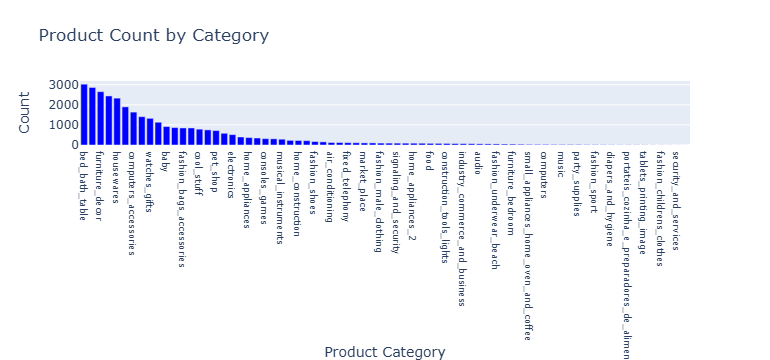

In [19]:
import plotly.express as px

# Plot the data using Plotly
fig = px.bar(
    df_category_count,
    x="category",
    y="product_count",
    title="Product Count by Category",
    labels={"category": "Product Category", "product_count": "Count"},
    # color="product_count",
    color_discrete_sequence=["blue"] # Use a blue color scale 
)

fig.update_layout(
    xaxis=dict(
        tickfont=dict(
            size=9
        )
    )
)

fig.show()


In [20]:
# Query to get the most popular product categories
query = """
    SELECT 
        pct.product_category_name_english,
        COUNT(oi.order_id) AS total_orders
    FROM 
        order_items AS oi
    INNER JOIN 
        products AS p ON oi.product_id = p.product_id
    INNER JOIN 
        product_category_translation AS pct ON p.product_category_name = pct.product_category_name
    GROUP BY 
        pct.product_category_name_english
    ORDER BY 
        total_orders DESC
    LIMIT 10;
"""

# Execute the query and store the results in a DataFrame
with engine.connect() as connection:
    df_top_products_category = pd.read_sql(query, connection)

# Print the DataFrame to inspect the results
print(df_top_products_category)



  product_category_name_english  total_orders
0                bed_bath_table          9324
1                 health_beauty          8804
2                sports_leisure          7688
3         computers_accessories          6666
4               furniture_decor          6334
5                    housewares          5823
6                 watches_gifts          5606
7                     telephony          4189
8                          auto          3872
9                          toys          3861


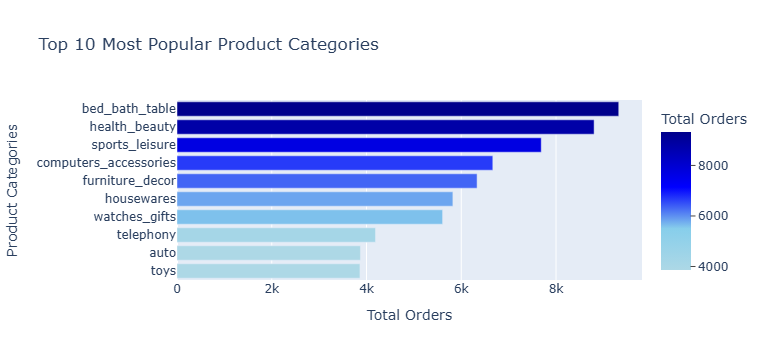

In [21]:

import plotly.express as px

# Plot
fig = px.bar(
    df_top_products_category,
    x='total_orders',
    y='product_category_name_english',
    title='Top 10 Most Popular Product Categories',
    labels={'product_category_name_english': 'Product Categories', 'total_orders': 'Total Orders'},
    orientation='h',
    color='total_orders',  # Use color to represent total orders
    color_continuous_scale=[
        (0.0, "lightblue"),  # Low values
        (0.3, "skyblue"),    # Mid-low values
        (0.6, "blue"),       # Mid-high values
        (1.0, "darkblue")    # High values
    ]  # Fully blue gradient
)

# Adjust layout and category order
fig.update_layout(
    yaxis={'categoryorder': 'total ascending'},  # Ensure descending order
    coloraxis_colorbar=dict(
        title="Total Orders",
        ticks="outside"
    )
)

fig.show()

In [10]:
query = """
SELECT 
    p.product_id,
    p.product_category_name,
    pct.product_category_name_english,
    p.product_photos_qty,
    p.product_weight_g,
    p.product_length_cm,
    p.product_height_cm,
    p.product_width_cm
FROM 
    products p
LEFT JOIN 
    product_category_translation pct
ON 
    p.product_category_name = pct.product_category_name;
    """

with engine.connect() as connection:
   df_products = pd.read_sql_query(query, connection)

print(df_products)



                             product_id  product_category_name  \
0      1e9e8ef04dbcff4541ed26657ea517e5             perfumaria   
1      3aa071139cb16b67ca9e5dea641aaa2f                  artes   
2      96bd76ec8810374ed1b65e291975717f          esporte_lazer   
3      cef67bcfe19066a932b7673e239eb23d                  bebes   
4      9dc1a7de274444849c219cff195d0b71  utilidades_domesticas   
...                                 ...                    ...   
32920  fe34503c6bccf918db601aaafd4a975a                 others   
32921  fedccbd5e370e8ddb7aae6fb4cb70347                 others   
32922  ff09b38ea3889c433325e313807936ea                 others   
32923  ff6caf9340512b8bf6d2a2a6df032cfa                 others   
32924  ff8bb42702f38636b348fd7e2332ce2f                 others   

      product_category_name_english  product_photos_qty  product_weight_g  \
0                         perfumery                 1.0             225.0   
1                               art                 1

In [16]:
# `df_products` 
fig = px.scatter(
    df_products,
    x="product_weight_g",
    y="product_length_cm",
    color="product_category_name_english",
    title="Product Weight vs. Length by Category",
    labels={"product_weight_g": "Weight (g)", "product_length_cm": "Length (cm)"},
    hover_data=["product_id"],
)
fig.show()


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [4]:
query = """
SELECT 
    pct.product_category_name_english AS category,
    AVG(p.product_weight_g) AS avg_weight,
    AVG(p.product_length_cm) AS avg_length,
    AVG(p.product_height_cm) AS avg_height,
    AVG(p.product_width_cm) AS avg_width
FROM 
    products p
LEFT JOIN 
    product_category_translation pct
ON 
    p.product_category_name = pct.product_category_name
GROUP BY 
    pct.product_category_name_english;
"""

with engine.connect() as connection:
    df_product_dimension = pd.read_sql_query(query, connection)

print(df_product_dimension)


                          category   avg_weight  avg_length  avg_height  \
0   industry_commerce_and_business  5929.191176   39.058824   32.514706   
1              diapers_and_hygiene  1037.500000   25.000000   17.583333   
2                    fashion_shoes  1044.508671   26.028902   13.381503   
3                  home_appliances  1979.654054   29.805405   14.891892   
4                    fashion_sport   344.736842   22.105263   12.842105   
..                             ...          ...         ...         ...   
69                         flowers  1403.571429   21.714286   15.571429   
70               home_construction  3395.715556   29.328889   24.377778   
71                            auto  2654.650526   34.050000   16.241579   
72              christmas_supplies  1849.815385   28.230769   16.215385   
73                           music  1213.518519   27.148148    9.925926   

    avg_width  
0   29.220588  
1   19.250000  
2   24.947977  
3   21.859459  
4   16.263158  
.. 

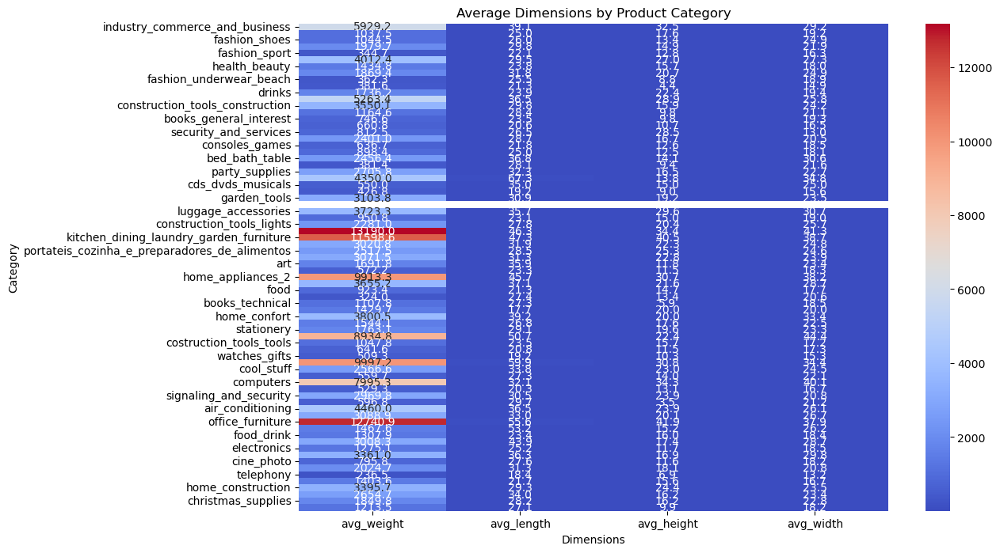

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# Assuming you have a dataframe `df_avg_dimensions`
plt.figure(figsize=(12, 8))
sns.heatmap(
    df_product_dimension.set_index("category"),
    annot=True,
    cmap="coolwarm",
    fmt=".1f",
)
plt.title("Average Dimensions by Product Category")
plt.xlabel("Dimensions")
plt.ylabel("Category")
plt.show()



In [20]:
# SQL query to fetch reviews
query_reviews = """
SELECT 
    review_id,
    order_id,
    review_score,
    review_comment_message_translated,
    review_creation_date,
    review_answer_timestamp
FROM 
    reviews;
"""

# Fetch data into DataFrame
with engine.connect() as connection:
    reviews_df = pd.read_sql_query(query_reviews, connection)

# Inspect data
reviews_df


,review_id,order_id,review_score,review_comment_message_translated,review_creation_date,review_answer_timestamp
0,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,Efficient apparatus.On the site the brand of t...,2018-05-22,2018-05-23 16:45:47
1,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,"TRUST SELLER, PRODUCT OK AND DELIVERS BEFORE T...",2018-05-23,2018-05-24 03:00:01
2,373cbeecea8286a2b66c97b1b157ec46,583174fbe37d3d5f0d6661be3aad1786,1,Pessimal,2018-08-15,2018-08-15 04:10:37
3,d21bbc789670eab777d27372ab9094cc,4fc44d78867142c627497b60a7e0228a,5,NOTE 10 STORE,2018-07-10,2018-07-11 14:10:25
4,c92cdd7dd544a01aa35137f901669cdf,37e7875cdce5a9e5b3a692971f370151,4,I received exactly what I expected.The other o...,2018-06-07,2018-06-09 18:44:02
...,...,...,...,...,...,...
9793,47e0954e156dac6512c25c6d2ecc1c66,16cbf959cfdb88c47ee2a29303547ec2,5,"Thank you very much,\r\n\r\nExcellent service,...",2018-05-22,2018-05-23 00:51:43
9794,0e7bc73fde6782891898ea71443f9904,bd78f91afbb1ecbc6124974c5e813043,4,Approved!,2018-07-04,2018-07-05 00:25:13
9795,58be140ccdc12e8908ff7fd2ba5c7cb0,0ebf8e35b9807ee2d717922d5663ccdb,5,"We are very pleased with the product, meets ou...",2018-06-30,2018-07-02 23:09:35
9796,51de4e06a6b701cb2be47ea0e689437b,b7467ae483dbe956fe9acdf0b1e6e3f4,3,Good morning \r\nOf the 6 units purchased I on...,2018-06-05,2018-06-06 10:52:19


In [21]:
from textblob import TextBlob

# Preprocess reviews by calculating sentiment
reviews_df['review_sentiment'] = reviews_df['review_comment_message_translated'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# Replace NaN values with 0 sentiment
reviews_df['review_sentiment'].fillna(0)

# Inspect changes
reviews_df[['review_comment_message_translated', 'review_sentiment']]


,review_comment_message_translated,review_sentiment
0,Efficient apparatus.On the site the brand of t...,0.00
1,"TRUST SELLER, PRODUCT OK AND DELIVERS BEFORE T...",0.50
2,Pessimal,0.00
3,NOTE 10 STORE,0.00
4,I received exactly what I expected.The other o...,0.00
...,...,...
9793,"Thank you very much,\r\n\r\nExcellent service,...",0.75
9794,Approved!,0.00
9795,"We are very pleased with the product, meets ou...",0.45
9796,Good morning \r\nOf the 6 units purchased I on...,0.35


In [22]:
import plotly.express as px

# Aggregate sentiment over time
avg_sentiment = reviews_df.groupby('review_creation_date')['review_sentiment'].mean().reset_index()

# Plot sentiment trends
fig = px.line(
    avg_sentiment,
    x='review_creation_date',
    y='review_sentiment',
    title="Average Sentiment Score Over Time",
    labels={"review_creation_date": "Date", "review_sentiment": "Average Sentiment"}
)

fig.show()


In [23]:
query = """
WITH sentiment_data AS (
    SELECT 
        review_score,
        review_comment_message_translated,
        review_creation_date::timestamp as review_date,
        -- placeholder for sentiment score
        CASE 
            WHEN review_score >= 4 THEN 'Positive'
            WHEN review_score <= 2 THEN 'Negative'
            ELSE 'Neutral'
        END as sentiment_category
    FROM 
        reviews
)
SELECT 
    review_score,
    sentiment_category,
    DATE_TRUNC('month', review_date) as review_month,
    review_comment_message_translated,
    COUNT(*) as review_count
FROM 
    sentiment_data
GROUP BY 
    review_score,
    sentiment_category,
    review_month,
    review_comment_message_translated
ORDER BY 
    review_month;
"""

# Fetch data into DataFrame
with engine.connect() as connection:
    reviews_df = pd.read_sql_query(query, connection)

# Inspect data
reviews_df


,review_score,sentiment_category,review_month,review_comment_message_translated,review_count
0,5,Positive,2017-05-01,very good store,1
1,5,Positive,2017-06-01,excellent product,1
2,1,Negative,2017-09-01,Camera did not work,1
3,5,Positive,2017-10-01,"Well, it met the expectations.",1
4,1,Negative,2017-10-01,The purchase of this item reminds me of a song...,1
...,...,...,...,...,...
9188,5,Positive,2018-08-01,Everything went well,1
9189,5,Positive,2018-08-01,Just can't get infrared,1
9190,3,Neutral,2018-08-01,This one came correct.The first,1
9191,5,Positive,2018-08-01,The deadline and the product arrived correctly.,1


In [24]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Sentiment Timeline (kept from before as it works well)
def plot_sentiment_timeline():
    monthly_sentiments = reviews_df.groupby([pd.Grouper(key='review_month'), 'sentiment_category']).size().reset_index()
    fig = px.line(monthly_sentiments, 
                  x='review_month', 
                  y=0, 
                  color='sentiment_category',
                  title='Sentiment Trends Over Time',
                  labels={'review_month': 'Month', '0': 'Number of Reviews'})
    fig.show()

# 2. Review Score Distribution
def plot_score_distribution():
    fig = px.bar(reviews_df.groupby('review_score')['review_count'].sum().reset_index(),
                 x='review_score',
                 y='review_count',
                 title='Distribution of Review Scores',
                 labels={'review_score': 'Review Score', 'review_count': 'Number of Reviews'},
                 color='review_score',
                 color_continuous_scale='RdYlBu')
    fig.show()

# 3. Sentiment Category Pie Chart
def plot_sentiment_pie():
    sentiment_totals = reviews_df.groupby('sentiment_category')['review_count'].sum()
    fig = px.pie(values=sentiment_totals.values,
                 names=sentiment_totals.index,
                 title='Distribution of Sentiment Categories',
                 color_discrete_sequence=px.colors.qualitative.Set3)
    fig.show()

# 4. Monthly Review Score Trends
def plot_monthly_scores():
    monthly_scores = reviews_df.groupby([pd.Grouper(key='review_month'), 'review_score'])['review_count'].sum().reset_index()
    fig = px.bar(monthly_scores,
                 x='review_month',
                 y='review_count',
                 color='review_score',
                 title='Monthly Distribution of Review Scores',
                 labels={'review_month': 'Month', 
                        'review_count': 'Number of Reviews',
                        'review_score': 'Review Score'})
    fig.show()

# 5. Stacked Area Chart of Sentiments
def plot_stacked_sentiments():
    monthly_sentiments = reviews_df.pivot_table(
        index='review_month',
        columns='sentiment_category',
        values='review_count',
        aggfunc='sum'
    ).fillna(0)
    
    fig = px.area(monthly_sentiments,
                  title='Sentiment Composition Over Time',
                  labels={'value': 'Number of Reviews', 
                         'review_month': 'Month'},
                  color_discrete_sequence=px.colors.qualitative.Set3)
    fig.show()

# Execute all visualizations
plot_sentiment_timeline()
plot_score_distribution()
plot_sentiment_pie()
plot_monthly_scores()
plot_stacked_sentiments()

# Create a combined dashboard
def create_dashboard():
    fig = go.Figure()
    
    # Add traces for each sentiment category
    for category in reviews_df['sentiment_category'].unique():
        category_data = reviews_df[reviews_df['sentiment_category'] == category]
        monthly_data = category_data.groupby('review_month')['review_count'].sum()
        
        fig.add_trace(
            go.Scatter(
                x=monthly_data.index,
                y=monthly_data.values,
                name=category,
                mode='lines+markers',
                fill='tonexty'
            )
        )
    
    fig.update_layout(
        title='Comprehensive Sentiment Analysis Dashboard',
        xaxis_title='Month',
        yaxis_title='Number of Reviews',
        hovermode='x unified',
        showlegend=True,
        height=600
    )
    
    fig.show()

# Show the dashboard
create_dashboard()


In [8]:
query_orders = """
SELECT 
    order_id,
    customer_id,
    order_purchase_timestamp,
    order_estimated_delivery_date,
    order_delivered_customer_date,
    order_status,
    delivery_delay,
    delay_category,
    month
FROM 
    orders;
"""

# Fetch data into DataFrame
with engine.connect() as connection:
    orders_df = pd.read_sql_query(query_orders, connection)

# Inspect data
orders_df


,order_id,customer_id,order_purchase_timestamp,order_estimated_delivery_date,order_delivered_customer_date,order_status,delivery_delay,delay_category,month
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-18,2017-10-10 21:25:13,delivered,-8.0,Very Early,2017-10
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-13,2018-08-07 15:27:45,delivered,-6.0,Early,2018-07
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-09-04,2018-08-17 18:06:29,delivered,-18.0,Very Early,2018-08
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-15,2017-12-02 00:28:42,delivered,-13.0,Very Early,2017-11
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-26,2018-02-16 18:17:02,delivered,-10.0,Very Early,2018-02
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,2017-03-28,2017-03-17 15:08:01,delivered,-11.0,Very Early,2017-03
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,2018-03-02,2018-02-28 17:37:56,delivered,-2.0,Early,2018-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,2017-09-27,2017-09-21 11:24:17,delivered,-6.0,Early,2017-08
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,2018-02-15,2018-01-25 23:32:54,delivered,-21.0,Very Early,2018-01


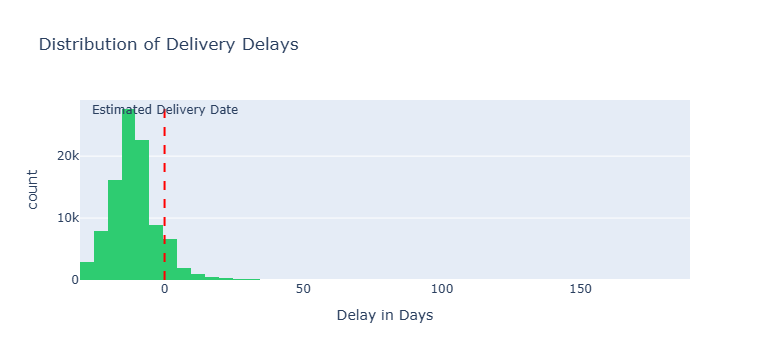

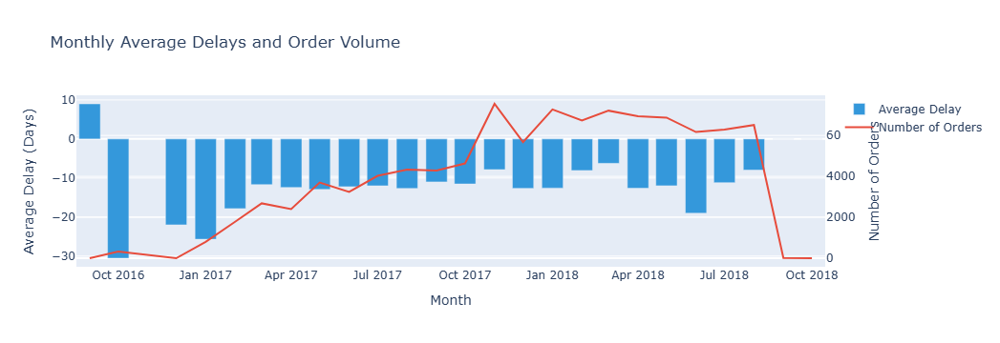

Delivery Performance Metrics:
Average Delay: -11.5 days
On-Time Delivery Rate: 93.4%
Severe Delay Rate: 2.9%


In [10]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

# Clean and prepare the data
orders_df['delivery_delay'] = orders_df['delivery_delay'].fillna(0)
orders_df['order_purchase_timestamp'] = pd.to_datetime(orders_df['order_purchase_timestamp'])
orders_df['month'] = orders_df['order_purchase_timestamp'].dt.to_period('M')

# 1. Delivery Delay Distribution
def plot_delay_distribution():
    fig = px.histogram(
        orders_df[orders_df['delivery_delay'] > -30],  # Filter out extreme outliers
        x='delivery_delay',
        title='Distribution of Delivery Delays',
        labels={'delivery_delay': 'Delay in Days', 'count': 'Number of Orders'},
        color_discrete_sequence=['#2ecc71'],
        nbins=50
    )
    fig.add_vline(x=0, line_dash="dash", line_color="red")
    fig.update_layout(
        annotations=[
            dict(
                x=0,
                y=1,
                yref="paper",
                text="Estimated Delivery Date",
                showarrow=False
            )
        ]
    )
    fig.show()

# 2. Monthly Average Delays
def plot_monthly_delays():
    monthly_delays = orders_df.groupby('month')['delivery_delay'].agg(['mean', 'count']).reset_index()
    monthly_delays['month'] = monthly_delays['month'].astype(str)
    
    fig = go.Figure()
    fig.add_trace(
        go.Bar(
            x=monthly_delays['month'],
            y=monthly_delays['mean'],
            name='Average Delay',
            marker_color='#3498db'
        )
    )
    fig.add_trace(
        go.Scatter(
            x=monthly_delays['month'],
            y=monthly_delays['count'],
            name='Number of Orders',
            yaxis='y2',
            line=dict(color='#e74c3c')
        )
    )
    
    fig.update_layout(
        title='Monthly Average Delays and Order Volume',
        xaxis_title='Month',
        yaxis_title='Average Delay (Days)',
        yaxis2=dict(
            title='Number of Orders',
            overlaying='y',
            side='right'
        ),
        showlegend=True
    )
    fig.show()

# 3. Delay Categories Analysis
def plot_delay_categories():
    orders_df['delay_category'] = pd.cut(
        orders_df['delivery_delay'],
        bins=[-np.inf, -7, -1, 0, 3, 7, np.inf],
        labels=['Very Early', 'Early', 'On Time', 'Slight Delay', 'Moderate Delay', 'Severe Delay']
    )
    
    delay_counts = orders_df['delay_category'].value_counts()
    
    fig = px.pie(
        values=delay_counts.values,
        names=delay_counts.index,
        title='Distribution of Delivery Performance',
        color_discrete_sequence=px.colors.qualitative.Set3
    )
    fig.show()

# 4. Status vs Delay Analysis
def plot_status_delays():
    status_delays = orders_df.groupby('order_status')['delivery_delay'].agg(['mean', 'count']).reset_index()
    
    fig = px.bar(
        status_delays,
        x='order_status',
        y='mean',
        title='Average Delay by Order Status',
        labels={'mean': 'Average Delay (Days)', 'order_status': 'Order Status'},
        color='count',
        text=status_delays['mean'].round(1)
    )
    fig.update_traces(textposition='outside')
    fig.show()

# 5. Delay Heatmap by Day of Week and Hour
def plot_delay_heatmap():
    orders_df['day_of_week'] = orders_df['order_purchase_timestamp'].dt.day_name()
    orders_df['hour'] = orders_df['order_purchase_timestamp'].dt.hour
    
    delay_matrix = orders_df.pivot_table(
        values='delivery_delay',
        index='day_of_week',
        columns='hour',
        aggfunc='mean'
    )
    
    fig = px.imshow(
        delay_matrix,
        title='Average Delays by Day and Hour',
        labels=dict(x='Hour of Day', y='Day of Week', color='Average Delay (Days)'),
        aspect='auto',
        color_continuous_scale='RdYlBu_r'
    )
    fig.show()

# Execute all visualizations
plot_delay_distribution()
plot_monthly_delays()
plot_delay_categories()
plot_status_delays()
plot_delay_heatmap()

# Create a summary dashboard
def create_delay_dashboard():
    # Calculate key metrics
    avg_delay = orders_df['delivery_delay'].mean()
    on_time_pct = (orders_df['delivery_delay'] <= 0).mean() * 100
    severe_delay_pct = (orders_df['delivery_delay'] > 7).mean() * 100
    
    print(f"Delivery Performance Metrics:")
    print(f"Average Delay: {avg_delay:.1f} days")
    print(f"On-Time Delivery Rate: {on_time_pct:.1f}%")
    print(f"Severe Delay Rate: {severe_delay_pct:.1f}%")

create_delay_dashboard()

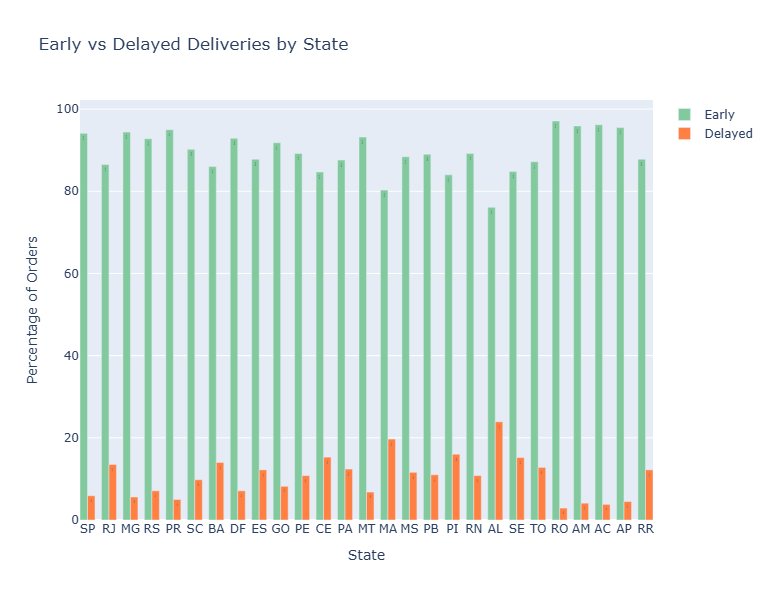

In [10]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sqlalchemy import create_engine
import numpy as np


# Query to get delivery data
deliver_query = """
SELECT 
   c.customer_state,
   COUNT(CASE 
       WHEN o.order_delivered_customer_date < o.order_estimated_delivery_date 
       THEN 1 
   END) as early_orders,
   COUNT(CASE 
       WHEN o.order_delivered_customer_date > o.order_estimated_delivery_date 
       THEN 1 
   END) as delayed_orders,
   COUNT(o.order_id) as total_orders
FROM 
   orders o
   JOIN customers c ON o.customer_id = c.customer_id
WHERE 
   o.order_status = 'delivered'
GROUP BY 
   c.customer_state
ORDER BY 
   total_orders DESC;
"""
# Fetch data into DataFrame
with engine.connect() as connection:
    df = pd.read_sql_query(deliver_query, connection)

# Inspect data
df

# Calculate percentages
df['early_pct'] = (df['early_orders'] / df['total_orders'] * 100).round(1)
df['delayed_pct'] = (df['delayed_orders'] / df['total_orders'] * 100).round(1)

# Create figure
fig = go.Figure()

# Add bars for each state
x_positions = list(range(len(df['customer_state'])))
width = 0.35

# Early delivery bars
fig.add_trace(go.Bar(
   x=[x - width/2 for x in x_positions],
   y=df['early_pct'],
   name='Early',
   marker_color='#82ca9d',
   width=width,
   text=df['early_pct'].apply(lambda x: f'{x}%'),
   textposition='auto',
))

# Delayed delivery bars
fig.add_trace(go.Bar(
   x=[x + width/2 for x in x_positions],
   y=df['delayed_pct'],
   name='Delayed',
   marker_color='#ff8042',
   width=width,
   text=df['delayed_pct'].apply(lambda x: f'{x}%'),
   textposition='auto',
))

# Update layout
fig.update_layout(
   title='Early vs Delayed Deliveries by State',
   xaxis=dict(
       title='State',
       ticktext=df['customer_state'],
       tickvals=x_positions,
   ),
   yaxis=dict(title='Percentage of Orders'),
   barmode='group',
   width=1000,
   height=600,
   showlegend=True
)

# Show plot
fig.show()


# Optional: Save plot
fig.write_html("delivery_performance.html")

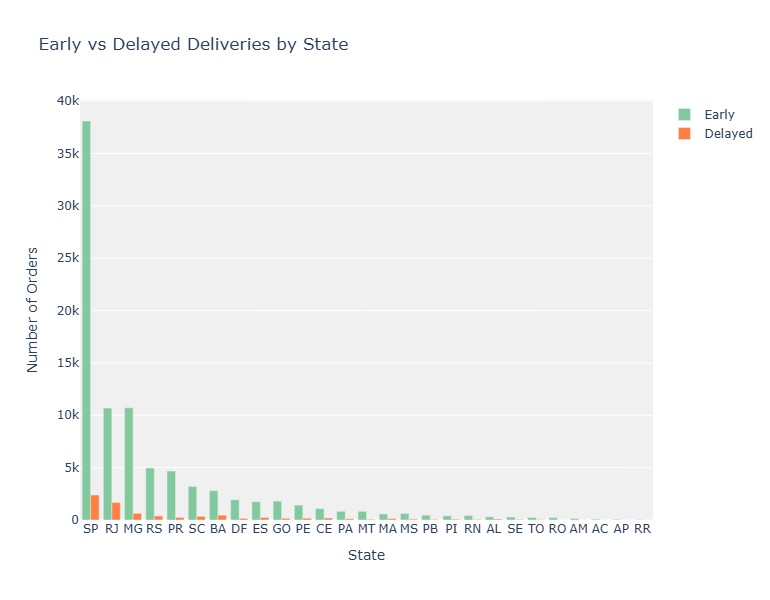

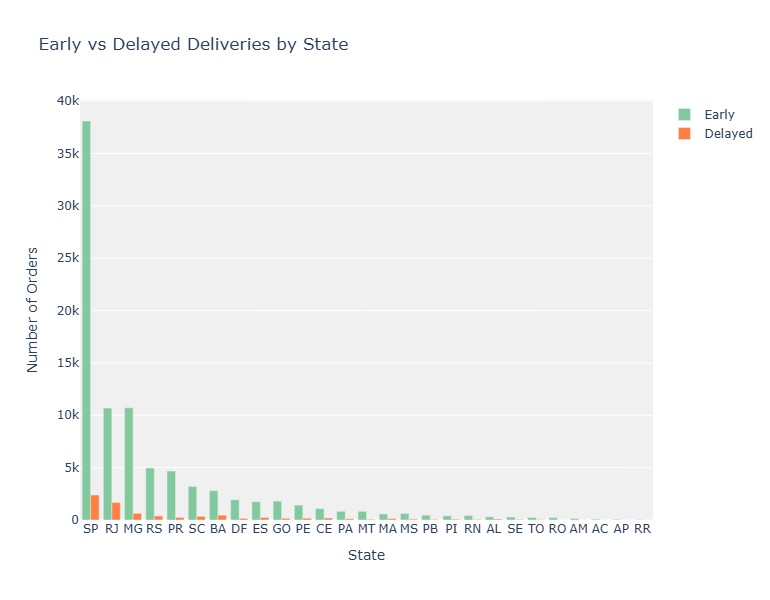

In [15]:
import pandas as pd
import plotly.graph_objects as go
from sqlalchemy import create_engine


query = """
SELECT 
   c.customer_state,
   COUNT(CASE WHEN o.order_delivered_customer_date < o.order_estimated_delivery_date THEN 1 END) as early_orders,
   COUNT(CASE WHEN o.order_delivered_customer_date > o.order_estimated_delivery_date THEN 1 END) as delayed_orders
FROM 
   orders o
   JOIN customers c ON o.customer_id = c.customer_id
WHERE 
   o.order_status = 'delivered'
GROUP BY 
   c.customer_state
ORDER BY 
   COUNT(o.order_id) DESC;
"""

# Fetch data into DataFrame
with engine.connect() as connection:
    df = pd.read_sql_query(deliver_query, connection)

# Inspect data
df


fig = go.Figure()

fig.add_trace(go.Bar(
    x=df['customer_state'],
    y=df['early_orders'],
    name='Early',
    marker_color='#82ca9d'
))

fig.add_trace(go.Bar(
    x=df['customer_state'],
    y=df['delayed_orders'],
    name='Delayed',
    marker_color='#ff8042'
))

fig.update_layout(
    title='Early vs Delayed Deliveries by State',
    xaxis_title='State',
    yaxis_title='Number of Orders',
    barmode='group',
    width=1000,
    height=600,
    plot_bgcolor='rgba(240,240,240,0.95)'
)

fig.show()
fig.show()
fig.write_html("delivery_comparison.html")

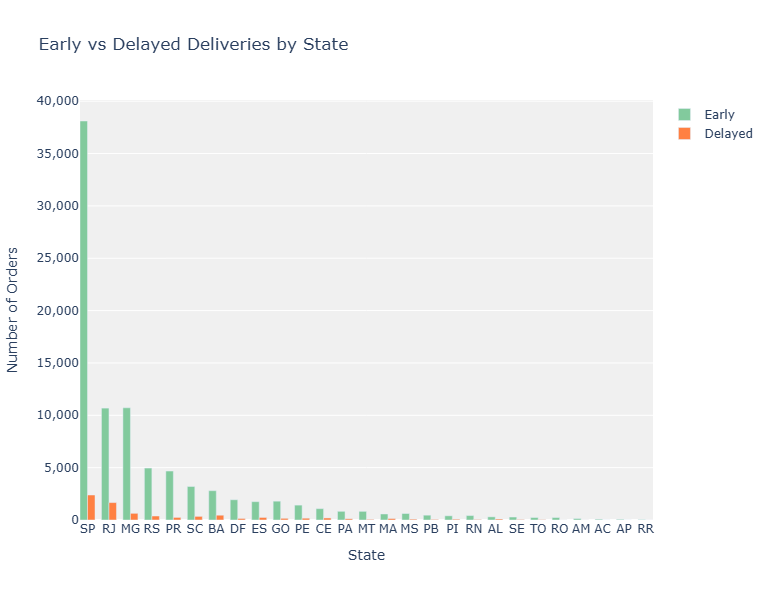

In [14]:
import pandas as pd
import plotly.graph_objects as go
from sqlalchemy import create_engine


query = """
SELECT 
   c.customer_state,
   COUNT(CASE WHEN o.order_delivered_customer_date < o.order_estimated_delivery_date THEN 1 END) as early_orders,
   COUNT(CASE WHEN o.order_delivered_customer_date > o.order_estimated_delivery_date THEN 1 END) as delayed_orders
FROM 
   orders o
   JOIN customers c ON o.customer_id = c.customer_id
WHERE 
   o.order_status = 'delivered'
GROUP BY 
   c.customer_state
ORDER BY 
   COUNT(o.order_id) DESC;
"""

# Fetch data into DataFrame
with engine.connect() as connection:
    df = pd.read_sql_query(deliver_query, connection)

# Inspect data
df

fig = go.Figure()
x_positions = list(range(len(df['customer_state'])))
width = 0.35

fig.add_trace(go.Bar(
   x=[x - width/2 for x in x_positions],
   y=df['early_orders'],
   name='Early',
   marker_color='#82ca9d',
   width=width,
))

fig.add_trace(go.Bar(
   x=[x + width/2 for x in x_positions],
   y=df['delayed_orders'],
   name='Delayed',
   marker_color='#ff8042',
   width=width,
))

fig.update_layout(
   title='Early vs Delayed Deliveries by State',
   xaxis=dict(
       title='State',
       ticktext=df['customer_state'],
       tickvals=x_positions,
   ),
   yaxis=dict(
       title='Number of Orders',
       tickformat=',.0f',
   ),
   barmode='group',
   width=1000,
   height=600,
   showlegend=True,
   plot_bgcolor='rgba(240,240,240,0.95)'
)

fig.show()
fig.write_html("delivery_comparison.html")

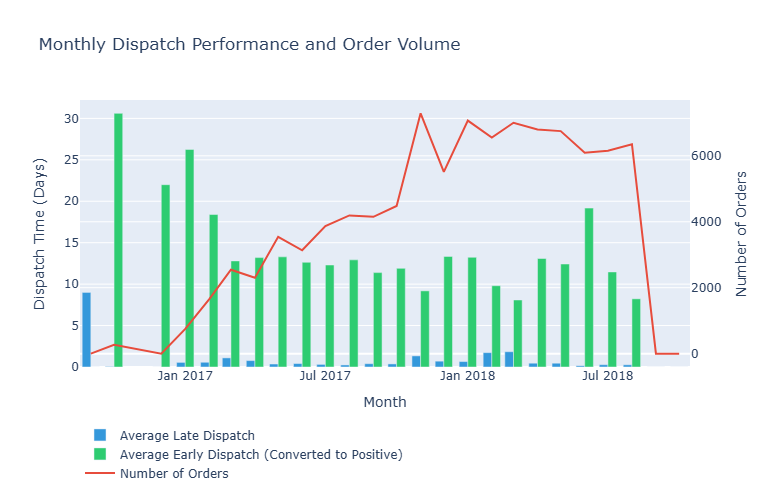

In [9]:
## Update the terms
orders_df['early_dispatch'] = orders_df['delivery_delay'].apply(lambda x: -x if x < 0 else 0)
orders_df['late_dispatch'] = orders_df['delivery_delay'].apply(lambda x: x if x > 0 else 0)

# Aggregate data by month
monthly_delays = orders_df.groupby('month').agg({
    'late_dispatch': 'mean',
    'early_dispatch': 'mean',
    'delivery_delay': 'count'
}).reset_index()

monthly_delays['month'] = monthly_delays['month'].astype(str)

# monthly_delays.to_csv('monthly_delays.csv', index=False)


# Plot the chart
fig = go.Figure()

# Average Late Dispatch
fig.add_trace(
    go.Bar(
        x=monthly_delays['month'],
        y=monthly_delays['late_dispatch'],
        name='Average Late Dispatch',
        marker_color='#3498db'
    )
)

# Average Early Dispatch
fig.add_trace(
    go.Bar(
        x=monthly_delays['month'],
        y=monthly_delays['early_dispatch'],
        name='Average Early Dispatch (Converted to Positive)',
        marker_color='#2ecc71'
    )
)

# Number of Orders
fig.add_trace(
    go.Scatter(
        x=monthly_delays['month'],
        y=monthly_delays['delivery_delay'],
        name='Number of Orders',
        yaxis='y2',
        line=dict(color='#e74c3c')
    )
)

# Update layout for better readability
fig.update_layout(
    title='Monthly Dispatch Performance and Order Volume',
    xaxis_title='Month',
    yaxis_title='Dispatch Time (Days)',
    yaxis2=dict(
        title='Number of Orders',
        overlaying='y',
        side='right'
    ),
    barmode='group',  # Separate the early and late dispatch into two columns
    showlegend=True,
    legend=dict(
        orientation='h',  # Horizontal legend
        x=0,  # Start at the left
        y=-0.2,  # Place below the chart
        traceorder='normal'
    ),
    width=800,  # Wider chart
    height=500   # Taller chart
)

fig.show()


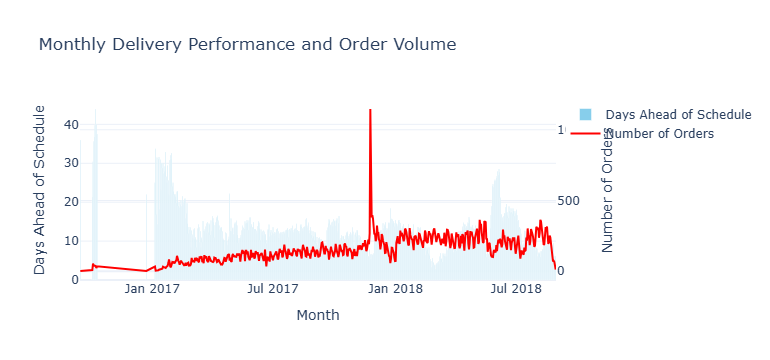

In [15]:
from sqlalchemy import text
import plotly.graph_objects as go
import pandas as pd

# Time series analysis showing early vs late delivery
time_series_query = text("""
    SELECT 
        DATE(order_purchase_timestamp) as date,
        COUNT(*) as order_count,
        ABS(AVG(delivery_delay)) as delivery_performance  -- Added ABS to convert negative to positive
    FROM orders
    WHERE order_delivered_customer_date IS NOT NULL
    GROUP BY DATE(order_purchase_timestamp)
    ORDER BY date;
""")

# Get data from database
with engine.connect() as conn:
    df_time = pd.read_sql(time_series_query, conn)
    df_time.set_index('date', inplace=True)

# Create visualization
fig = go.Figure()

# Add bar chart for delivery performance
fig.add_trace(
    go.Bar(
        x=df_time.index,
        y=df_time['delivery_performance'],
        name='Days Ahead of Schedule',  # Changed name to reflect positive values
        marker_color='skyblue'
    )
)

# Add line for order volume
fig.add_trace(
    go.Scatter(
        x=df_time.index,
        y=df_time['order_count'],
        name='Number of Orders',
        yaxis='y2',
        line=dict(color='red')
    )
)

# Update layout
fig.update_layout(
    title='Monthly Delivery Performance and Order Volume',
    xaxis_title='Month',
    yaxis_title='Days Ahead of Schedule',  # Updated y-axis title
    yaxis2=dict(
        title='Number of Orders',
        overlaying='y',
        side='right'
    ),
    showlegend=True,
    height=500,
    template='plotly_white'
)

fig.show()

In [27]:
query_products = """
SELECT 
    p.product_id,
    p.product_category_name,
    t.product_category_name_english,
    p.product_name_length,
    p.product_photos_qty
FROM 
    products p
LEFT JOIN 
    product_category_translation t
ON 
    p.product_category_name = t.product_category_name;
"""

# Fetch product category data
with engine.connect() as connection:
    products_df = pd.read_sql_query(query_products, connection)

products_df


,product_id,product_category_name,product_category_name_english,product_name_length,product_photos_qty
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,perfumery,40.0,1.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,art,44.0,1.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,sports_leisure,46.0,1.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,baby,27.0,1.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,housewares,37.0,4.0
...,...,...,...,...,...
32920,fe34503c6bccf918db601aaafd4a975a,others,others,NaN,NaN
32921,fedccbd5e370e8ddb7aae6fb4cb70347,others,others,NaN,NaN
32922,ff09b38ea3889c433325e313807936ea,others,others,NaN,NaN
32923,ff6caf9340512b8bf6d2a2a6df032cfa,others,others,NaN,NaN


In [24]:
from sqlalchemy import create_engine

# Query to calculate total payment value by state
query = """
SELECT 
    c.customer_state AS state,
    SUM(p.payment_value) AS total_payment_value
FROM 
    payments p
INNER JOIN 
    orders o
ON 
    p.order_id = o.order_id
INNER JOIN 
    customers c
ON 
    o.customer_id = c.customer_id
GROUP BY 
    c.customer_state
ORDER BY 
    total_payment_value DESC;
"""

# Fetch the data
with engine.connect() as connection:
    df_payment_by_state = pd.read_sql_query(query, connection)

print(df_payment_by_state)

   state  total_payment_value
0     SP           5998226.96
1     RJ           2144379.69
2     MG           1872257.26
3     RS            890898.54
4     PR            811156.38
5     SC            623086.43
6     BA            616645.82
7     DF            355141.08
8     GO            350092.31
9     ES            325967.55
10    PE            324850.44
11    CE            279464.03
12    PA            218295.85
13    MT            187029.29
14    MA            152523.02
15    PB            141545.72
16    MS            137534.84
17    PI            108523.97
18    RN            102718.13
19    AL             96962.06
20    SE             75246.25
21    TO             61485.33
22    RO             60866.20
23    AM             27966.93
24    AC             19680.62
25    AP             16262.80
26    RR             10064.62


C:\Users\yi_xu\AppData\Local\Temp\ipykernel_25032\872144452.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




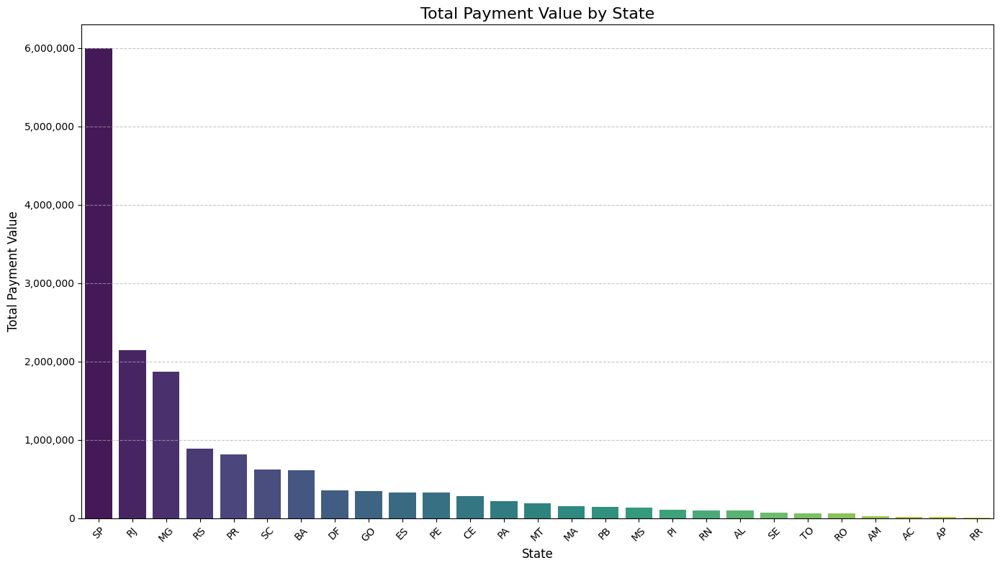

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Formatter function to show values in full numeric format
def format_full_numbers(x, _):
    return f"{int(x):,}"

# Plot the total payment value by state with swapped axes
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_payment_by_state, 
    x='state', 
    y='total_payment_value', 
    palette="viridis"
)

# Title and labels
plt.title('Total Payment Value by State', fontsize=16)
plt.xlabel('State', fontsize=12)
plt.ylabel('Total Payment Value', fontsize=12)

# Format y-axis ticks
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_full_numbers))

# Additional formatting
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, fontsize=10)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


In [31]:
query = """
SELECT 
    orders.order_id,
    orders.order_purchase_timestamp,
    payments.payment_value
FROM 
    orders
JOIN 
    payments
ON 
    orders.order_id = payments.order_id;
"""

with engine.connect() as connection:
    sales_data = pd.read_sql_query(query, connection)
print(sales_data)

                                order_id order_purchase_timestamp  \
0       a9810da82917af2d9aefd1278f1dcfa0      2018-06-26 11:01:38   
1       ba78997921bbcdc1373bb41e913ab953      2017-12-06 12:04:06   
2       42fdf880ba16b47b59251dd489d4441a      2018-05-21 13:59:17   
3       298fcdf1f73eb413e4d26d01b25bc1cd      2018-05-07 13:20:41   
4       1f78449c87a54faf9e96e88ba1491fa9      2018-07-22 14:07:35   
...                                  ...                      ...   
103881  40ec2cf5cb1eb0bf1ea2b117552fecb5      2017-11-09 08:55:21   
103882  2e3d96522c8c378d4135c12a65c977aa      2017-11-23 17:11:23   
103883  0406037ad97740d563a178ecc7a2075c      2018-03-08 16:57:23   
103884  7b905861d7c825891d6347454ea7863f      2017-08-18 09:45:35   
103885  b8b61059626efa996a60be9bb9320e10      2018-08-07 23:26:13   

        payment_value  
0               24.39  
1              107.78  
2              128.45  
3               96.12  
4              341.09  
...               ...  
103

In [32]:
# Convert 'order_purchase_timestamp' to datetime
sales_data['order_purchase_timestamp'] = pd.to_datetime(sales_data['order_purchase_timestamp'])

# Extract features like year, month, and day
sales_data['year'] = sales_data['order_purchase_timestamp'].dt.year
sales_data['month'] = sales_data['order_purchase_timestamp'].dt.month
sales_data['day'] = sales_data['order_purchase_timestamp'].dt.day

# Aggregate data by month for sales prediction
monthly_sales = sales_data.groupby(['year', 'month'])['payment_value'].sum().reset_index()
monthly_sales['date'] = pd.to_datetime(monthly_sales[['year', 'month']].assign(day=1))
monthly_sales = monthly_sales[['date', 'payment_value']]


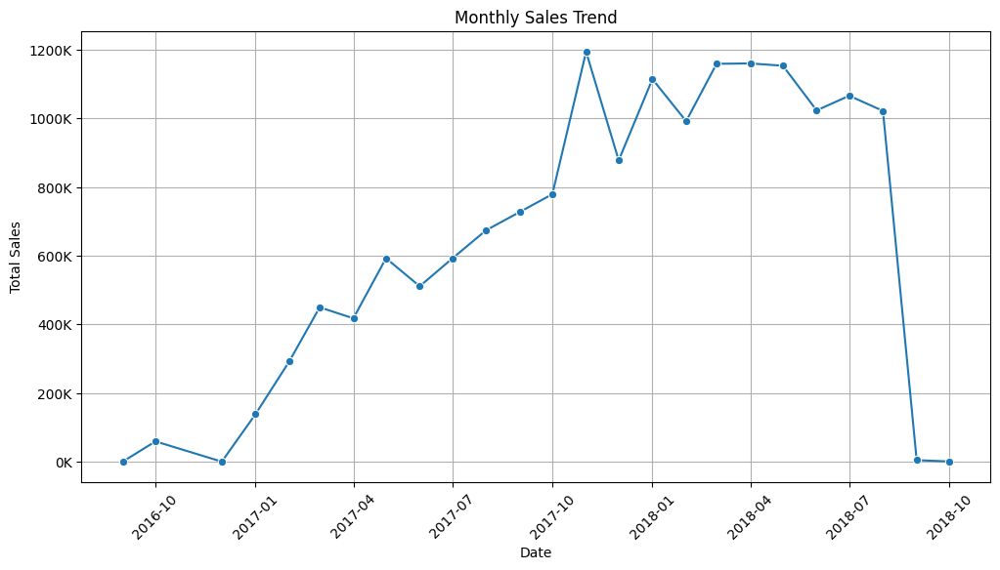

In [33]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='payment_value', data=monthly_sales, marker='o')
plt.title('Monthly Sales Trend')
plt.xlabel('Date')
plt.ylabel('Total Sales')

# Format y-axis to display values in thousands
ax = plt.gca()
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x/1000:.0f}K'))
plt.xticks(rotation=45)
plt.grid()
plt.show()


In [47]:
# More detailed payment analysis
payment_query = text("""
    SELECT 
        payment_type,
        ROUND(AVG(payment_value)::numeric, 2) as avg_payment
    FROM payments
    WHERE payment_type != 'not_defined'  -- Exclude not_defined
    GROUP BY payment_type
    ORDER BY avg_payment DESC;  -- Order by average payment in descending order
""")

with engine.connect() as conn:
    payment_stats = pd.read_sql(payment_query, conn)
    print("\nDetailed Payment Statistics:")
    print(payment_stats)


Detailed Payment Statistics:
  payment_type  avg_payment
0  credit_card       163.32
1       boleto       145.03
2   debit_card       142.57
3      voucher        65.70


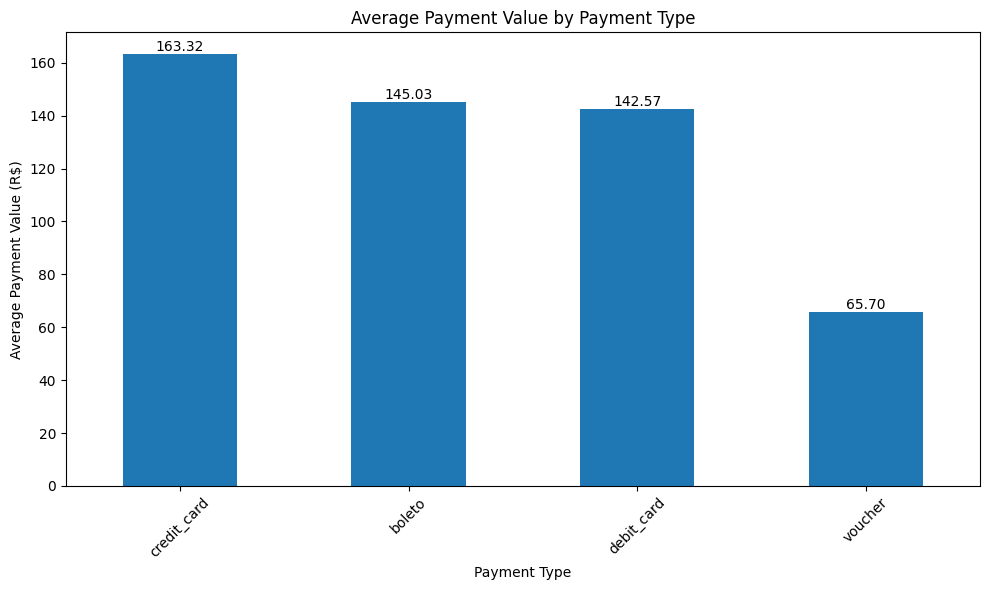

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Create bar plot
payment_stats.plot.bar(
    x='payment_type',
    y='avg_payment',  # Changed from 'average_payment' to 'avg_payment'
    ax=ax,
    legend=False
)

# Customize plot
plt.xlabel('Payment Type')
plt.ylabel('Average Payment Value (R$)')
plt.title('Average Payment Value by Payment Type')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add value labels on top of bars
for i, v in enumerate(payment_stats['avg_payment']):  # Changed here too
    ax.text(i, v, f'{v:,.2f}', 
            ha='center', va='bottom')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show plot
plt.show()

In [36]:
query = """
SELECT 
    orders.order_id,
    orders.order_purchase_timestamp,
    payments.payment_value
FROM 
    orders
JOIN 
    payments
ON 
    orders.order_id = payments.order_id;
"""

with engine.connect() as connection:
    sales_data = pd.read_sql_query(query, connection)
print(sales_data)

                                order_id order_purchase_timestamp  \
0       a9810da82917af2d9aefd1278f1dcfa0      2018-06-26 11:01:38   
1       ba78997921bbcdc1373bb41e913ab953      2017-12-06 12:04:06   
2       42fdf880ba16b47b59251dd489d4441a      2018-05-21 13:59:17   
3       298fcdf1f73eb413e4d26d01b25bc1cd      2018-05-07 13:20:41   
4       1f78449c87a54faf9e96e88ba1491fa9      2018-07-22 14:07:35   
...                                  ...                      ...   
103881  40ec2cf5cb1eb0bf1ea2b117552fecb5      2017-11-09 08:55:21   
103882  2e3d96522c8c378d4135c12a65c977aa      2017-11-23 17:11:23   
103883  0406037ad97740d563a178ecc7a2075c      2018-03-08 16:57:23   
103884  7b905861d7c825891d6347454ea7863f      2017-08-18 09:45:35   
103885  b8b61059626efa996a60be9bb9320e10      2018-08-07 23:26:13   

        payment_value  
0               24.39  
1              107.78  
2              128.45  
3               96.12  
4              341.09  
...               ...  
103

In [12]:
from sqlalchemy import text
# Query to get hourly order distribution
timing_query = text("""
    SELECT 
        EXTRACT(HOUR FROM order_purchase_timestamp) as hour_of_day,
        COUNT(*) as order_count
    FROM orders
    GROUP BY hour_of_day
    ORDER BY hour_of_day;
""")

with engine.connect() as conn:
    df_timing = pd.read_sql(timing_query, conn)
print(df_timing)

    hour_of_day  order_count
0           0.0         2394
1           1.0         1170
2           2.0          510
3           3.0          272
4           4.0          206
5           5.0          188
6           6.0          502
7           7.0         1231
8           8.0         2967
9           9.0         4785
10         10.0         6177
11         11.0         6578
12         12.0         5995
13         13.0         6518
14         14.0         6569
15         15.0         6454
16         16.0         6675
17         17.0         6150
18         18.0         5769
19         19.0         5982
20         20.0         6193
21         21.0         6217
22         22.0         5816
23         23.0         4123


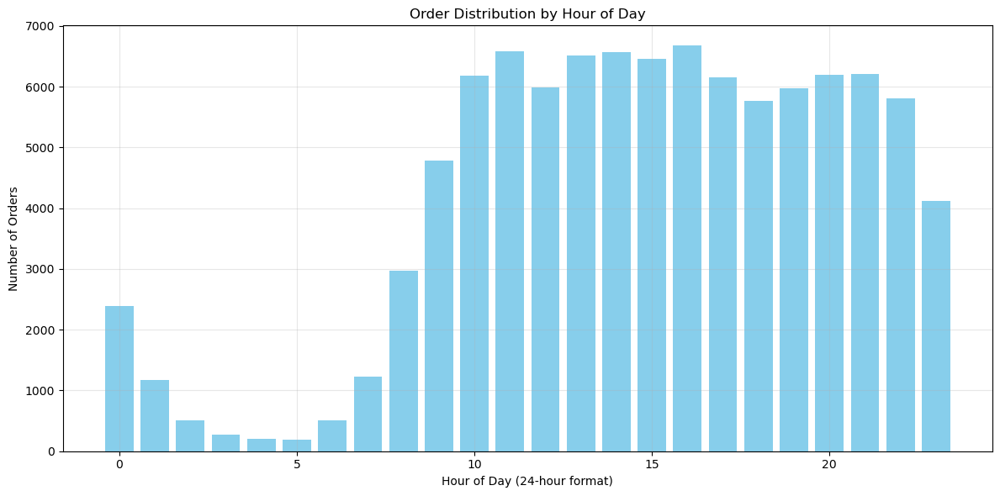


Peak Order Hours:
    hour_of_day  order_count
16         16.0         6675
11         11.0         6578
14         14.0         6569


In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create simple bar plot
plt.figure(figsize=(12, 6))
plt.bar(df_timing['hour_of_day'], df_timing['order_count'], 
        color='skyblue')

# Customize plot
plt.title('Order Distribution by Hour of Day')
plt.xlabel('Hour of Day (24-hour format)')
plt.ylabel('Number of Orders')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print peak hours simply
print("\nPeak Order Hours:")
print(df_timing.nlargest(3, 'order_count'))


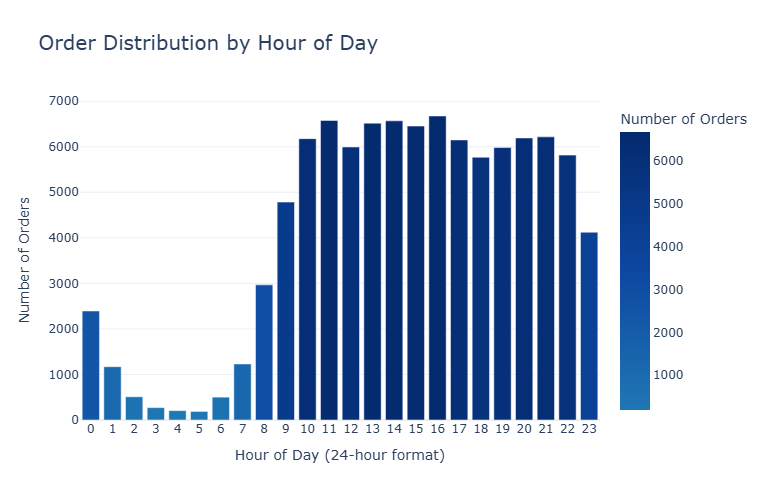


Peak Order Hours:
    hour_of_day  order_count
16         16.0         6675
11         11.0         6578
14         14.0         6569


In [14]:
import plotly.express as px

# Create an interactive bar plot
fig = px.bar(
    df_timing,
    x='hour_of_day',
    y='order_count',
    title='Order Distribution by Hour of Day',
    labels={'hour_of_day': 'Hour of Day (24-hour format)', 'order_count': 'Number of Orders'},
    color='order_count',  # Add color to indicate order count
    color_continuous_scale=['#1f77b4', '#0d47a1', '#042a6e']  # Darker blue shades
)

# Customize the layout
fig.update_layout(
    xaxis=dict(title='Hour of Day (24-hour format)', tickmode='linear'),
    yaxis=dict(title='Number of Orders'),
    width=800,
    height=500,
    title_font_size=20,
    template='plotly_white'
)

# Show the plot
fig.show()

# Print peak hours
print("\nPeak Order Hours:")
print(df_timing.nlargest(3, 'order_count'))


In [ ]:
import plotly.express as px

# Create an interactive bar plot
fig = px.bar(
    df_timing,
    x='hour_of_day',
    y='order_count',
    title='Order Distribution by Hour of Day',
    labels={'hour_of_day': 'Hour of Day (24-hour format)', 'order_count': 'Number of Orders'},
    color='order_count',  # Optional: Add a color scale for better visual impact
    color_continuous_scale='Blues'  # Customize color scale
)

# Customize the layout
fig.update_layout(
    xaxis=dict(title='Hour of Day (24-hour format)', tickmode='linear'),
    yaxis=dict(title='Number of Orders'),
    width=1000,
    height=500,
    title_font_size=20,
    template='plotly_white'
)

# Show the plot
fig.show()

# Print peak hours
print("\nPeak Order Hours:")
print(df_timing.nlargest(3, 'order_count'))


### Recommendations for Purchase Timing

#### Dynamic Pricing Strategy
- Implement time-based discounts during low-traffic hours.
- Offer special promotions during peak purchase times.
- Introduce early-bird specials for morning shoppers.

#### Customer Service Optimization
- Increase customer service staff during peak hours.
- Provide automated support during off-hours.
- Schedule marketing emails based on customer active hours.


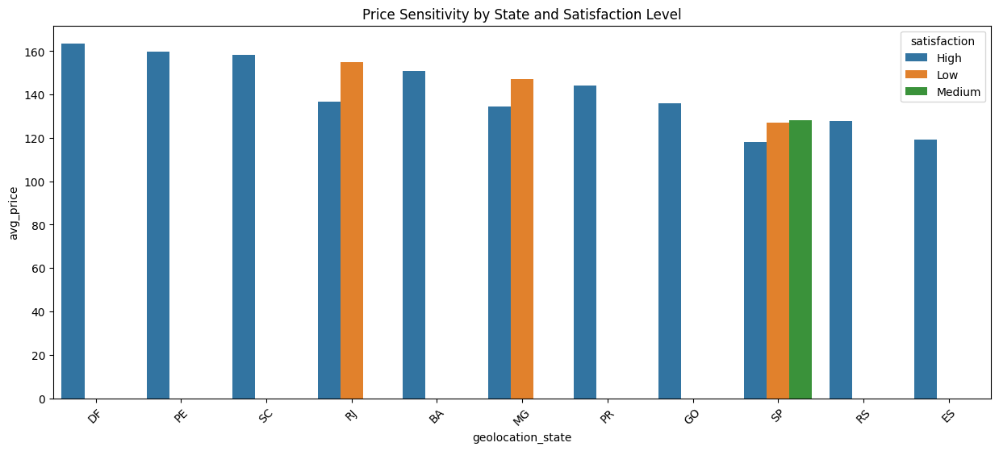

In [43]:
# Query for regional price sensitivity
price_sensitivity_query = text("""
    WITH order_stats AS (
        SELECT 
            g.geolocation_state,
            oi.price,
            CASE 
                WHEN r.review_score >= 4 THEN 'High'
                WHEN r.review_score <= 2 THEN 'Low'
                ELSE 'Medium'
            END as satisfaction
        FROM order_items oi
        JOIN orders o ON oi.order_id = o.order_id
        JOIN customers c ON o.customer_id = c.customer_id
        JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
        JOIN reviews r ON o.order_id = r.order_id
    )
    SELECT 
        geolocation_state,
        satisfaction,
        COUNT(*) as count,
        ROUND(AVG(price)::numeric, 2) as avg_price
    FROM order_stats
    GROUP BY 1, 2
    HAVING COUNT(*) > 100
    ORDER BY avg_price DESC;  -- Changed to DESC order
""")

# Create visualization
with engine.connect() as conn:
    df_sensitivity = pd.read_sql(price_sensitivity_query, conn)

plt.figure(figsize=(15, 6))
sns.barplot(data=df_sensitivity, 
            x='geolocation_state', 
            y='avg_price', 
            hue='satisfaction',
            order=df_sensitivity['geolocation_state'].unique())  # Maintain order
plt.title('Price Sensitivity by State and Satisfaction Level')
plt.xticks(rotation=45)
plt.show()

In [18]:
# Regional price sensitivity and performance
geographic_analysis_query = text("""
    SELECT 
        g.geolocation_state,
        COUNT(DISTINCT o.order_id) as total_orders,
        ROUND(AVG(oi.price), 2) as avg_price,
        ROUND(AVG(r.review_score), 2) as satisfaction,
        ROUND(AVG(oi.freight_value), 2) as avg_freight
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    JOIN order_items oi ON o.order_id = oi.order_id
    JOIN reviews r ON o.order_id = r.order_id
    GROUP BY g.geolocation_state
    HAVING COUNT(DISTINCT o.order_id) > 100
    ORDER BY satisfaction DESC;
""")

# Create visualization for regional analysis
with engine.connect() as conn:
    df_geo = pd.read_sql(geographic_analysis_query, conn)

print(df_geo)

   geolocation_state  total_orders  avg_price  satisfaction  avg_freight
0                 SC           290     151.11          3.94        25.24
1                 MG          1040     136.27          3.91        22.40
2                 DF           215     161.32          3.91        25.42
3                 SP          4240     120.83          3.91        16.00
4                 PR           414     148.91          3.91        25.08
5                 GO           195     144.15          3.88        24.33
6                 RS           424     144.69          3.87        24.38
7                 CE           143     188.66          3.82        35.89
8                 BA           399     156.40          3.75        30.24
9                 RJ          1234     140.84          3.74        23.27
10                ES           207     139.14          3.74        24.21
11                PE           208     157.31          3.70        36.66
12                PA           117     223.13      

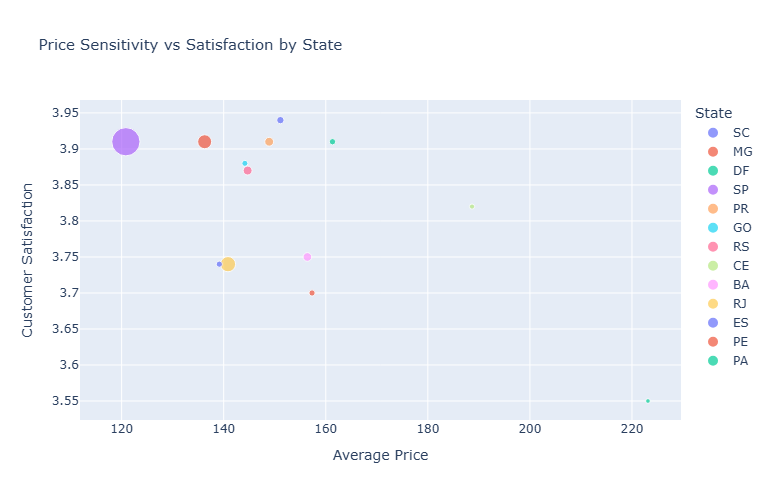

In [19]:
import plotly.express as px

# Create a bubble chart
fig = px.scatter(
    df_geo,
    x='avg_price',
    y='satisfaction',
    size='total_orders',
    color='geolocation_state',
    title='Price Sensitivity vs Satisfaction by State',
    labels={
        'avg_price': 'Average Price',
        'satisfaction': 'Customer Satisfaction',
        'geolocation_state': 'State'
    },
    hover_data=['total_orders', 'avg_freight']  # Additional info on hover
)

# Update layout for larger display
fig.update_layout(
    width=800,
    height=500,
    title_font_size=15,
    legend_title='State'
)

fig.show()


#### Geographic Recommendations

#### Regional Pricing Strategy
- Adjust pricing based on regional price sensitivity.
- Customize shipping costs by region.
- Launch regional promotional campaigns.

#### Location-Based Marketing
- Implement targeted advertising in high-potential regions.
- Provide regional product recommendations.
- Adapt strategies to suit local market preferences.


In [24]:
# Modified query for category combinations
simple_category_query = text("""
    WITH category_pairs AS (
        SELECT DISTINCT
            t1.product_category_name_english as category1,
            t2.product_category_name_english as category2,
            COUNT(*) as pair_count
        FROM order_items o1
        JOIN order_items o2 
            ON o1.order_id = o2.order_id 
            AND o1.product_id < o2.product_id
        JOIN products p1 ON o1.product_id = p1.product_id
        JOIN products p2 ON o2.product_id = p2.product_id
        JOIN product_category_translation t1 
            ON p1.product_category_name = t1.product_category_name
        JOIN product_category_translation t2 
            ON p2.product_category_name = t2.product_category_name
        GROUP BY t1.product_category_name_english, t2.product_category_name_english
    )
    SELECT *
    FROM category_pairs
    WHERE pair_count > 10
    ORDER BY pair_count DESC
    LIMIT 10;
""")

# Create visualization
with engine.connect() as conn:
    df_combinations = pd.read_sql(simple_category_query, conn)
    print("Number of combinations found:", len(df_combinations))
    print("\nSample of combinations:")
    print(df_combinations)

# Plot if we have data
if len(df_combinations) > 0:
    plt.figure(figsize=(12, 6))
    plt.bar(range(len(df_combinations)), df_combinations['pair_count'], color='skyblue')
    
    # Create readable labels
    labels = [f"{r['category1']}\n{r['category2']}" 
             for _, r in df_combinations.iterrows()]
    
    plt.title('Top Product Category Combinations')
    plt.xlabel('Category Pairs')
    plt.ylabel('Number of Co-purchases')
    plt.xticks(range(len(df_combinations)), labels, rotation=45, ha='right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("No category combinations found with the current criteria")

Number of combinations found: 0

Sample of combinations:
Empty DataFrame
Columns: [category1, category2, pair_count]
Index: []
No category combinations found with the current criteria


In [25]:
# Analysis of payment installments impact on satisfaction
payment_impact_query = text("""
    SELECT 
        CASE 
            WHEN payment_installments = 1 THEN 'Single Payment'
            WHEN payment_installments <= 3 THEN '2-3 Installments'
            WHEN payment_installments <= 6 THEN '4-6 Installments'
            ELSE '7+ Installments'
        END as installment_group,
        ROUND(AVG(review_score), 2) as avg_satisfaction,
        COUNT(*) as order_count,
        ROUND(AVG(payment_value), 2) as avg_order_value
    FROM payments p
    JOIN orders o ON p.order_id = o.order_id
    JOIN reviews r ON o.order_id = r.order_id
    GROUP BY installment_group
    ORDER BY avg_satisfaction DESC;
""")

# Create visualization for regional analysis
with engine.connect() as conn:
    df_payment_impact = pd.read_sql(payment_impact_query, conn)

print(df_payment_impact)

  installment_group  avg_satisfaction  order_count  avg_order_value
0    Single Payment              3.86         5053           121.91
1  4-6 Installments              3.85         1643           202.74
2  2-3 Installments              3.83         2196           145.73
3   7+ Installments              3.77         1289           394.91


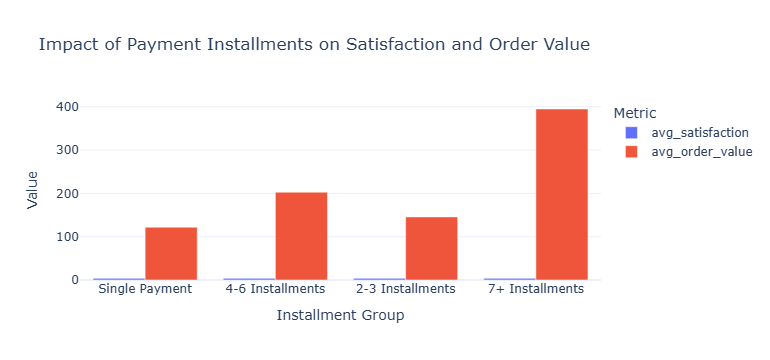

In [26]:
import plotly.express as px

# Melt the dataframe to prepare for grouped bar chart
df_melted = df_payment_impact.melt(
    id_vars='installment_group',
    value_vars=['avg_satisfaction', 'avg_order_value'],
    var_name='Metric',
    value_name='Value'
)

# Create a grouped bar chart
fig = px.bar(
    df_melted,
    x='installment_group',
    y='Value',
    color='Metric',
    barmode='group',
    labels={'installment_group': 'Installment Group', 'Value': 'Value'},
    title='Impact of Payment Installments on Satisfaction and Order Value',
    template='plotly_white'
)

# Show the figure
fig.show()


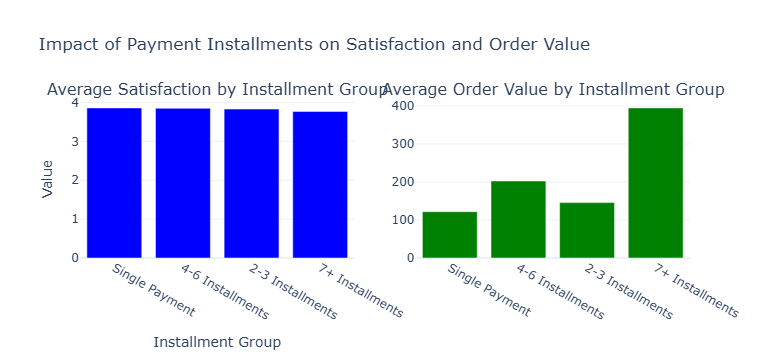

In [32]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a subplot for side-by-side bar charts
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Average Satisfaction by Installment Group", "Average Order Value by Installment Group"),
    shared_yaxes=False
)

# Add bar chart for average satisfaction
fig.add_trace(
    go.Bar(
        x=df_payment_impact['installment_group'],
        y=df_payment_impact['avg_satisfaction'],
        name="Average Satisfaction",
        marker_color='blue'
    ),
    row=1, col=1
)

# Add bar chart for average order value
fig.add_trace(
    go.Bar(
        x=df_payment_impact['installment_group'],
        y=df_payment_impact['avg_order_value'],
        name="Average Order Value",
        marker_color='green'
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title="Impact of Payment Installments on Satisfaction and Order Value",
    xaxis_title="Installment Group",
    yaxis_title="Value",
    showlegend=False,
    template="plotly_white"
)

# Show the figure
fig.show()


### Recommendations:

#### Payment & Pricing Strategy:

- Implement dynamic installment options based on cart value
- Offer early payment discounts
- Introduce loyalty program with payment benefits

In [27]:
# Analysis of delivery efficiency and satisfaction
delivery_analysis_query = text("""
    SELECT 
        g.geolocation_state,
        COUNT(*) as total_orders,
        ROUND(AVG(EXTRACT(DAY FROM 
            (order_delivered_customer_date - order_purchase_timestamp))), 1) as avg_delivery_days,
        ROUND(AVG(review_score), 2) as avg_satisfaction
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    JOIN reviews r ON o.order_id = r.order_id
    WHERE order_delivered_customer_date IS NOT NULL
    GROUP BY g.geolocation_state
    HAVING COUNT(*) > 100
    ORDER BY avg_satisfaction DESC;
""")

with engine.connect() as conn:
    df_delivery_analysis = pd.read_sql(delivery_analysis_query, conn)
print(df_delivery_analysis)

   geolocation_state  total_orders  avg_delivery_days  avg_satisfaction
0                 PR           402                9.3              4.00
1                 SC           286               11.1              3.98
2                 SP          4124                6.9              3.98
3                 DF           209                9.7              3.97
4                 MG          1024                9.4              3.95
5                 RS           417               11.7              3.90
6                 GO           194               12.4              3.89
7                 CE           139               18.7              3.86
8                 RJ          1184               12.0              3.84
9                 BA           390               18.0              3.79
10                ES           204               14.1              3.78
11                PE           200               16.4              3.76
12                PA           113               23.0           

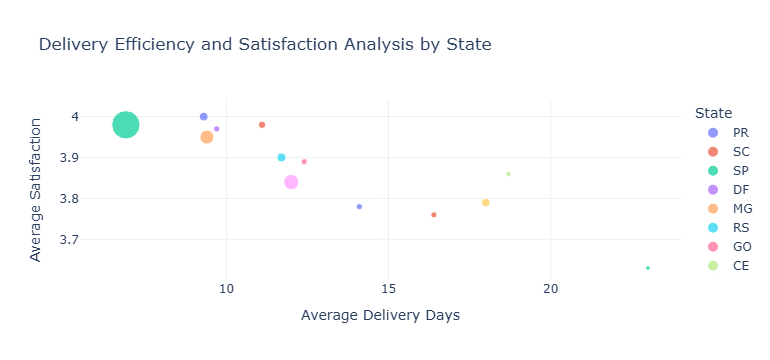

In [28]:
import plotly.express as px

# Create a scatter plot (bubble chart)
fig = px.scatter(
    df_delivery_analysis,
    x='avg_delivery_days',
    y='avg_satisfaction',
    size='total_orders',
    color='geolocation_state',
    labels={
        'avg_delivery_days': 'Average Delivery Days',
        'avg_satisfaction': 'Average Satisfaction',
        'geolocation_state': 'State'
    },
    title='Delivery Efficiency and Satisfaction Analysis by State',
    hover_data={'total_orders': True},
    template='plotly_white'
)

# Update layout for better readability
fig.update_layout(
    xaxis=dict(title='Average Delivery Days'),
    yaxis=dict(title='Average Satisfaction'),
    showlegend=True
)

# Show the figure
fig.show()

### Recommendations:
### Delivery Optimization:

- Set up regional distribution centers in high-volume states
- Implement real-time delivery tracking
- Partner with local delivery services in problematic regions

In [29]:
# Analysis of customer feedback patterns
feedback_analysis_query = text("""
    WITH sentiment_categories AS (
        SELECT 
            o.order_id,
            CASE 
                WHEN r.review_score >= 4 THEN 'Positive'
                WHEN r.review_score <= 2 THEN 'Negative'
                ELSE 'Neutral'
            END as sentiment,
            p.product_category_name,
            (o.order_delivered_customer_date - o.order_purchase_timestamp) as delivery_time,
            payment_value
        FROM orders o
        JOIN reviews r ON o.order_id = r.order_id
        JOIN order_items oi ON o.order_id = oi.order_id
        JOIN products p ON oi.product_id = p.product_id
        JOIN payments pay ON o.order_id = pay.order_id
    )
    SELECT 
        sentiment,
        COUNT(*) as count,
        ROUND(AVG(EXTRACT(DAY FROM delivery_time)), 1) as avg_delivery_days,
        ROUND(AVG(payment_value), 2) as avg_order_value
    FROM sentiment_categories
    GROUP BY sentiment
    ORDER BY count DESC;
""")

with engine.connect() as conn:
    df_feedback_analysis = pd.read_sql(feedback_analysis_query, conn)
print(df_feedback_analysis)

  sentiment  count  avg_delivery_days  avg_order_value
0  Positive   7099                9.0           162.45
1  Negative   2246               14.4           207.38
2   Neutral    759               11.5           183.30


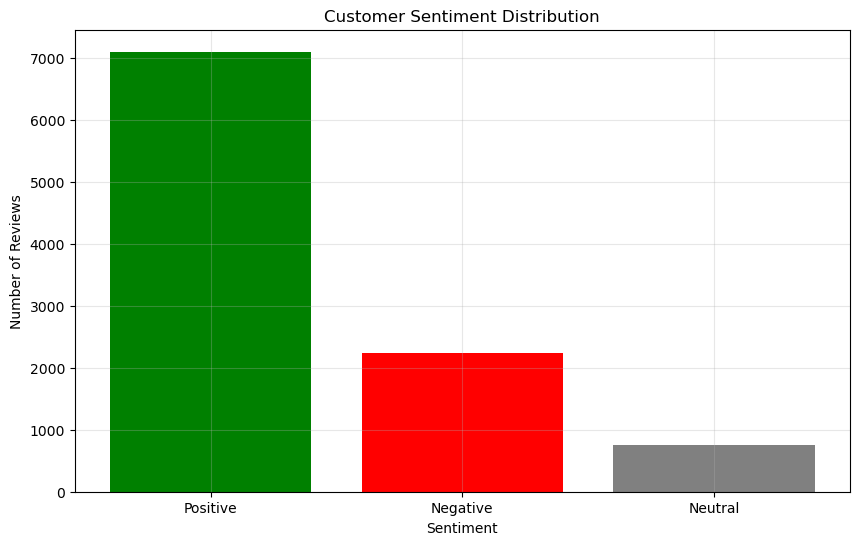

In [31]:
import plotly.express as px
import matplotlib.pyplot as plt

# Simple bar plot
plt.figure(figsize=(10, 6))
colors = {'Positive': 'green', 'Neutral': 'gray', 'Negative': 'red'}
plt.bar(df_feedback_analysis['sentiment'], df_feedback_analysis['count'], 
        color=[colors[x] for x in df_feedback_analysis['sentiment']])

plt.title('Customer Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Number of Reviews')
plt.grid(True, alpha=0.3)
plt.show()

### Recommendations:

#### Customer Communication:

- Implement automated order status updates
- Send personalized follow-up emails
- Create customer feedback loops

In [33]:
# Analysis of seller performance
seller_performance_query = text("""
    SELECT 
        s.seller_id,
        COUNT(DISTINCT o.order_id) as total_orders,
        ROUND(AVG(r.review_score), 2) as avg_rating,
        ROUND(AVG(EXTRACT(DAY FROM 
            (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) as avg_delivery_days
    FROM sellers s
    JOIN order_items oi ON s.seller_id = oi.seller_id
    JOIN orders o ON oi.order_id = o.order_id
    JOIN reviews r ON o.order_id = r.order_id
    GROUP BY s.seller_id
    HAVING COUNT(DISTINCT o.order_id) > 10
    ORDER BY avg_rating DESC;
""")

with engine.connect() as conn:
    df_seller_performance = pd.read_sql(seller_performance_query, conn)
print(df_seller_performance)

                            seller_id  total_orders  avg_rating  \
0    516e7738bd8f735ac19a010ee5450d8d            17        4.88   
1    a5cba26a62b8b4d0145b68b841e62e7f            13        4.85   
2    1e8b33f18b4f7598d87f5cbee2282cc2            25        4.84   
3    c66dccfb3f109511246da627dd5a2498            11        4.73   
4    594f9aaa48e5bf431f011ddc5669b0d5            15        4.73   
..                                ...           ...         ...   
189  5dceca129747e92ff8ef7a997dc4f8ca            19        2.74   
190  04308b1ee57b6625f47df1d56f00eedf            17        2.47   
191  855668e0971d4dfd7bef1b6a4133b41b            17        2.24   
192  bbad7e518d7af88a0897397ffdca1979            12        2.17   
193  2eb70248d66e0e3ef83659f71b244378           102        1.85   

     avg_delivery_days  
0                  7.0  
1                 10.9  
2                  6.7  
3                  8.5  
4                  7.3  
..                 ...  
189               17

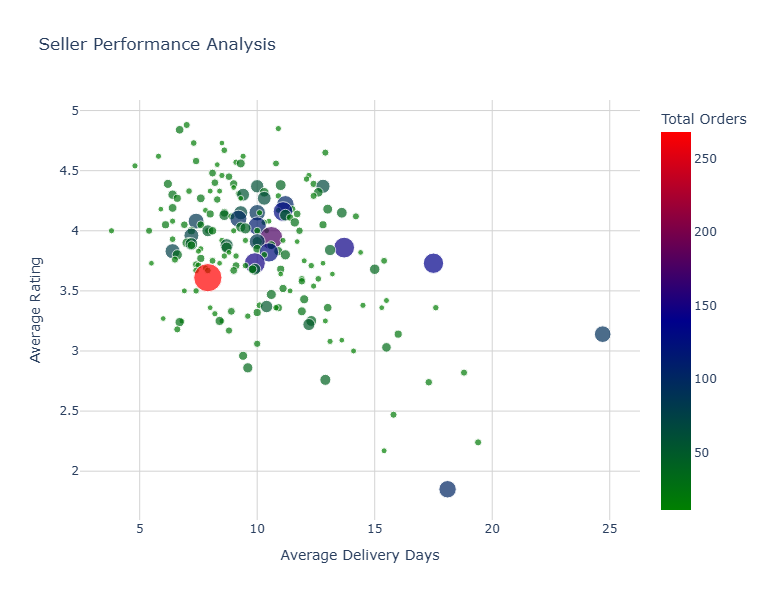

In [34]:
# Create interactive scatter plot
fig = px.scatter(
    df_seller_performance,
    x='avg_delivery_days',
    y='avg_rating',
    size='total_orders',
    color='total_orders',
    color_continuous_scale=['green', 'darkblue', 'red'],  # Custom color scale
    # Alternative options:
    # color_continuous_scale='YlOrRd_r',  # Yellow to Dark Red
    # color_continuous_scale='Viridis_r',  # Yellow to Dark Purple
    # color_continuous_scale='RdBu_r',    # Red to Dark Blue
    hover_data=['seller_id', 'total_orders'],
    title='Seller Performance Analysis',
    labels={
        'avg_delivery_days': 'Average Delivery Days',
        'avg_rating': 'Average Rating',
        'total_orders': 'Total Orders'
    }
)

# Update layout
fig.update_layout(
    hoverlabel=dict(bgcolor="white"),
    plot_bgcolor='rgba(0,0,0,0)',
    width=900,
    height=600
)

# Add grid
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')

fig.show()

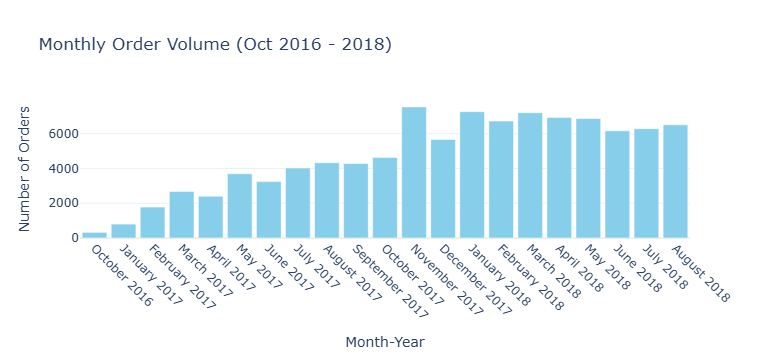


Monthly Order Volume Statistics:
       total_orders
count     21.000000
mean    4734.095238
std     2234.361540
min      324.000000
25%     3245.000000
50%     4631.000000
75%     6728.000000
max     7544.000000

Monthly Order Volumes:
October 2016: 324 orders
January 2017: 800 orders
February 2017: 1,780 orders
March 2017: 2,682 orders
April 2017: 2,404 orders
May 2017: 3,700 orders
June 2017: 3,245 orders
July 2017: 4,026 orders
August 2017: 4,331 orders
September 2017: 4,285 orders
October 2017: 4,631 orders
November 2017: 7,544 orders
December 2017: 5,673 orders
January 2018: 7,269 orders
February 2018: 6,728 orders
March 2018: 7,211 orders
April 2018: 6,939 orders
May 2018: 6,873 orders
June 2018: 6,167 orders
July 2018: 6,292 orders
August 2018: 6,512 orders


In [8]:
from sqlalchemy import text
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Query for monthly order volume
monthly_volume_query = text("""
   SELECT 
       EXTRACT(YEAR FROM order_purchase_timestamp) as year,
       EXTRACT(MONTH FROM order_purchase_timestamp) as month_num,
       TO_CHAR(order_purchase_timestamp, 'Month') as month_name,
       COUNT(*) as total_orders
   FROM orders
   WHERE 
       (EXTRACT(YEAR FROM order_purchase_timestamp) != 2016 
       OR (EXTRACT(YEAR FROM order_purchase_timestamp) = 2016 
           AND EXTRACT(MONTH FROM order_purchase_timestamp) = 10))
       AND NOT (EXTRACT(YEAR FROM order_purchase_timestamp) = 2018 
           AND EXTRACT(MONTH FROM order_purchase_timestamp) IN (9, 10))
   GROUP BY 
       EXTRACT(YEAR FROM order_purchase_timestamp),
       EXTRACT(MONTH FROM order_purchase_timestamp),
       TO_CHAR(order_purchase_timestamp, 'Month')
   ORDER BY 
       year, month_num;
""")

# Get data
with engine.connect() as conn:
   df_volume = pd.read_sql(monthly_volume_query, conn)

# Create month-year label
df_volume['month_year'] = df_volume.apply(lambda x: f"{x['month_name'].strip()} {int(x['year'])}", axis=1)

# Create visualization
fig = go.Figure()

# Add bar chart
fig.add_trace(
   go.Bar(
       x=df_volume['month_year'],
       y=df_volume['total_orders'],
       marker_color='skyblue',
       name='Number of Orders'
   )
)

# Update layout
fig.update_layout(
   title='Monthly Order Volume (Oct 2016 - 2018)',
   xaxis_title='Month-Year',
   yaxis_title='Number of Orders',
   showlegend=False,
   height=500,
   template='plotly_white',
   bargap=0.15
)

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)

fig.show()

# Print summary statistics
print("\nMonthly Order Volume Statistics:")
print(df_volume[['total_orders']].describe())

# Print monthly totals
print("\nMonthly Order Volumes:")
for _, row in df_volume.iterrows():
   print(f"{row['month_year']}: {row['total_orders']:,} orders")


Monthly Order Statistics:
                               month  order_count  avg_order_value
count                             23    23.000000        23.000000
mean   2017-10-28 16:41:44.347826176  4516.608696       160.302609
min              2016-10-01 00:00:00     4.000000       137.220000
25%              2017-05-16 12:00:00  2704.000000       148.905000
50%              2017-11-01 00:00:00  4550.000000       154.780000
75%              2018-04-16 00:00:00  6825.000000       161.445000
max              2018-10-01 00:00:00  7863.000000       277.470000
std                              NaN  2614.626737        26.787820


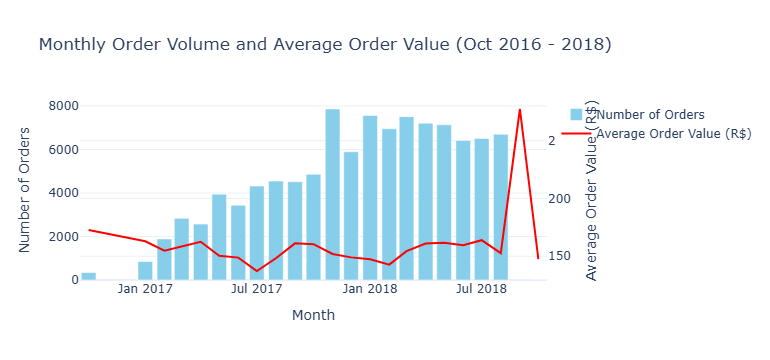

In [3]:
from sqlalchemy import text
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Query for monthly order counts
monthly_orders_query = text("""
    SELECT 
        DATE_TRUNC('month', order_purchase_timestamp) as month,
        COUNT(*) as order_count,
        ROUND(AVG(payment_value), 2) as avg_order_value
    FROM orders o
    JOIN payments p ON o.order_id = p.order_id
    WHERE EXTRACT(YEAR FROM order_purchase_timestamp) != 2016 
       OR (EXTRACT(YEAR FROM order_purchase_timestamp) = 2016 
           AND EXTRACT(MONTH FROM order_purchase_timestamp) = 10)
    GROUP BY DATE_TRUNC('month', order_purchase_timestamp)
    ORDER BY month;
""")

# Rest of the code remains the same
with engine.connect() as conn:
    df_monthly = pd.read_sql(monthly_orders_query, conn)
    df_monthly['month'] = pd.to_datetime(df_monthly['month'])

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=df_monthly['month'],
        y=df_monthly['order_count'],
        name='Number of Orders',
        marker_color='skyblue'
    )
)

fig.add_trace(
    go.Scatter(
        x=df_monthly['month'],
        y=df_monthly['avg_order_value'],
        name='Average Order Value (R$)',
        yaxis='y2',
        line=dict(color='red')
    )
)

fig.update_layout(
    title='Monthly Order Volume and Average Order Value (Oct 2016 - 2018)',
    xaxis_title='Month',
    yaxis_title='Number of Orders',
    yaxis2=dict(
        title='Average Order Value (R$)',
        overlaying='y',
        side='right'
    ),
    showlegend=True,
    height=500,
    template='plotly_white',
    bargap=0.15
)

print("\nMonthly Order Statistics:")
print(df_monthly.describe())

fig.show()


Monthly Order Statistics (Oct 2016 onwards):
                     month  order_count  avg_order_value
count                   24    24.000000        24.000000
mean   2017-10-14 21:00:00  4328.458333       154.440833
min    2016-10-01 00:00:00     1.000000        19.620000
25%    2017-04-23 12:00:00  2399.750000       148.655000
50%    2017-10-16 12:00:00  4533.000000       154.575000
75%    2018-04-08 12:00:00  6761.500000       161.297500
max    2018-10-01 00:00:00  7863.000000       277.470000
std                    NaN  2718.208441        38.872068


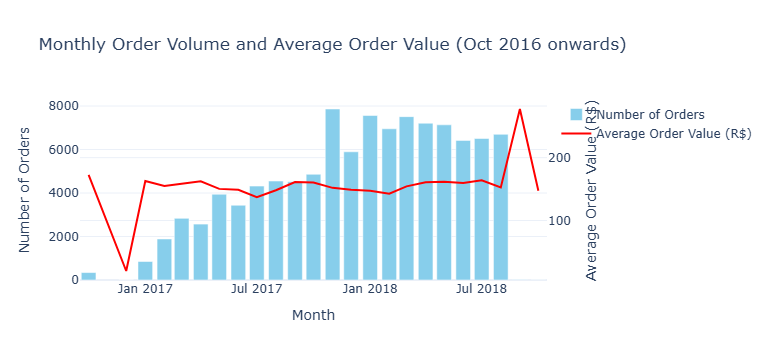

In [12]:
monthly_orders_query = text("""
    WITH monthly_data AS (
        SELECT 
            DATE_TRUNC('month', order_purchase_timestamp) as month,
            COUNT(*) as order_count,
            ROUND(AVG(payment_value), 2) as avg_order_value
        FROM orders o
        JOIN payments p ON o.order_id = p.order_id
        GROUP BY DATE_TRUNC('month', order_purchase_timestamp)
    )
    SELECT * 
    FROM monthly_data 
    WHERE month >= '2016-10-01'
    ORDER BY month;
""")

# Get data
with engine.connect() as conn:
    df_monthly = pd.read_sql(monthly_orders_query, conn)
    df_monthly['month'] = pd.to_datetime(df_monthly['month'])

# Create visualization
fig = go.Figure()

# Add bar chart for order count
fig.add_trace(
    go.Bar(
        x=df_monthly['month'],
        y=df_monthly['order_count'],
        name='Number of Orders',
        marker_color='skyblue'
    )
)

# Add line for average order value
fig.add_trace(
    go.Scatter(
        x=df_monthly['month'],
        y=df_monthly['avg_order_value'],
        name='Average Order Value (R$)',
        yaxis='y2',
        line=dict(color='red')
    )
)

# Update layout
fig.update_layout(
    title='Monthly Order Volume and Average Order Value (Oct 2016 onwards)',
    xaxis_title='Month',
    yaxis_title='Number of Orders',
    yaxis2=dict(
        title='Average Order Value (R$)',
        overlaying='y',
        side='right'
    ),
    showlegend=True,
    height=500,
    template='plotly_white',
    bargap=0.15
)

# Print monthly statistics
print("\nMonthly Order Statistics (Oct 2016 onwards):")
print(df_monthly.describe())

fig.show()

### Recommendations
### Product Quality Management:

- Implement quality control standards
- Create seller rating system
- Regular product catalog review

### Implementation Timeline:

#### Immediate (1-3 months):

- Enhanced communication system
- Basic seller rating system
- Payment optimization


#### Medium-term (3-6 months):

- Regional distribution centers
- Advanced seller support program
- Customer loyalty program


#### Long-term (6-12 months):

- Full quality management system
- Integrated delivery network
- Advanced analytics implementation

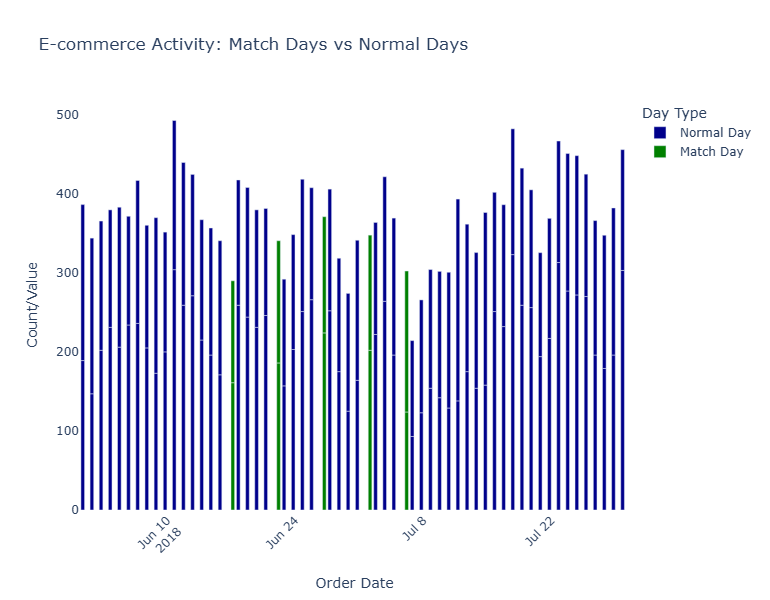


Analysis Results:
    order_date    day_type  order_count  avg_order_value
0   2018-06-01  Normal Day          189           197.27
1   2018-06-02  Normal Day          147           196.87
2   2018-06-03  Normal Day          202           163.49
3   2018-06-04  Normal Day          231           148.60
4   2018-06-05  Normal Day          206           177.04
5   2018-06-06  Normal Day          234           137.51
6   2018-06-07  Normal Day          236           180.83
7   2018-06-08  Normal Day          205           155.11
8   2018-06-09  Normal Day          173           196.73
9   2018-06-10  Normal Day          200           151.48
10  2018-06-11  Normal Day          304           188.64
11  2018-06-12  Normal Day          259           180.55
12  2018-06-13  Normal Day          271           153.46
13  2018-06-14  Normal Day          215           152.13
14  2018-06-15  Normal Day          196           160.71
15  2018-06-16  Normal Day          171           169.59
16  2018-06-

In [11]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sqlalchemy import text

# Query to analyze order patterns during World Cup 2018
soccer_impact_query = text("""

WITH daily_orders AS (
    SELECT 
        DATE(o.order_purchase_timestamp) as order_date,
        COUNT(*) as order_count,
        AVG(p.payment_value) as avg_order_value,
        CASE 
            WHEN DATE(o.order_purchase_timestamp) IN 
                ('2018-06-17', '2018-06-22', '2018-06-27', 
                 '2018-07-02', '2018-07-06') THEN 'Match Day'
            ELSE 'Normal Day'
        END as day_type
    FROM orders o
    JOIN payments p ON o.order_id = p.order_id
    WHERE o.order_purchase_timestamp 
        BETWEEN '2018-06-01' AND '2018-07-31'
    GROUP BY DATE(o.order_purchase_timestamp)
)
SELECT 
    order_date,
    day_type,
    order_count,
    ROUND(avg_order_value, 2) as avg_order_value
FROM daily_orders
ORDER BY order_date;
""")

# Execute the updated query
with engine.connect() as conn:
    df_soccer = pd.read_sql(soccer_impact_query, conn)

# Interactive bar plot with individual days
fig = px.bar(
    df_soccer,
    x='order_date',
    y=['order_count', 'avg_order_value'],
    barmode='group',
    title='E-commerce Activity: Match Days vs Normal Days',
    color='day_type',  # Color by day type (Match Day vs Normal Day)
    color_discrete_sequence=['darkblue', 'green'],
    labels={
        'order_date': 'Order Date',
        'value': 'Count/Value',
        'variable': 'Metric',
        'day_type': 'Day Type'
    }
)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    width=1000,
    height=600,
    xaxis_tickangle=-45
)

fig.show()

print("\nAnalysis Results:")
print(df_soccer)



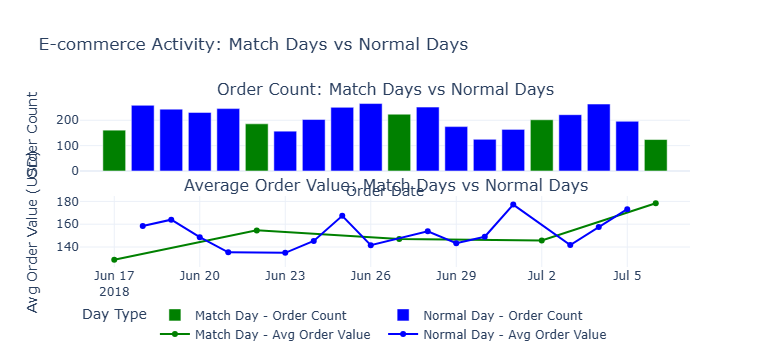

In [26]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sqlalchemy import create_engine, text



# Query to analyze order patterns during World Cup 2018
soccer_impact_query = text("""
WITH daily_orders AS (
    SELECT 
        DATE(o.order_purchase_timestamp) AS order_date,
        COUNT(*) AS order_count,
        AVG(p.payment_value) AS avg_order_value,
        CASE 
            WHEN DATE(o.order_purchase_timestamp) IN 
                ('2018-06-17', '2018-06-22', '2018-06-27', 
                 '2018-07-02', '2018-07-06') THEN 'Match Day'
            ELSE 'Normal Day'
        END AS day_type
    FROM orders o
    JOIN payments p ON o.order_id = p.order_id
    WHERE o.order_purchase_timestamp BETWEEN '2018-06-17' AND '2018-07-07'
    GROUP BY DATE(o.order_purchase_timestamp)
)
SELECT 
    order_date,
    day_type,
    order_count,
    ROUND(avg_order_value, 2) AS avg_order_value
FROM daily_orders
ORDER BY order_date;
""")

# Execute the query
with engine.connect() as conn:
    df_soccer = pd.read_sql(soccer_impact_query, conn)

# Convert 'order_date' column to datetime for better Plotly compatibility
df_soccer['order_date'] = pd.to_datetime(df_soccer['order_date'])

# Create subplots
fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    subplot_titles=("Order Count: Match Days vs Normal Days", 
                    "Average Order Value: Match Days vs Normal Days"),
    vertical_spacing=0.15
)

# Separate data into Match Days and Normal Days
match_days = df_soccer[df_soccer['day_type'] == 'Match Day']
normal_days = df_soccer[df_soccer['day_type'] == 'Normal Day']

# Plot Order Count (Row 1)
fig.add_trace(
    go.Bar(
        x=match_days['order_date'],
        y=match_days['order_count'],
        name='Match Day - Order Count',
        marker_color='green'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Bar(
        x=normal_days['order_date'],
        y=normal_days['order_count'],
        name='Normal Day - Order Count',
        marker_color='blue'
    ),
    row=1, col=1
)

# Plot Average Order Value (Row 2)
fig.add_trace(
    go.Scatter(
        x=match_days['order_date'],
        y=match_days['avg_order_value'],
        mode='lines+markers',
        name='Match Day - Avg Order Value',
        marker_color='green'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=normal_days['order_date'],
        y=normal_days['avg_order_value'],
        mode='lines+markers',
        name='Normal Day - Avg Order Value',
        marker_color='blue'
    ),
    row=2, col=1
)

# Update layout for better readability
fig.update_layout(
    title='E-commerce Activity: Match Days vs Normal Days',
    height=800,
    showlegend=True,
    legend=dict(title="Day Type", orientation="h", y=-0.2),
    template='plotly_white'
)

# Update x-axis to show dates clearly
fig.update_xaxes(
    title_text='Order Date',
    tickformat="%Y-%m-%d",  # Show full date format
    tickangle=45,  # Rotate labels for better readability
    row=1, col=1
)

# Adjust y-axis labels
fig.update_yaxes(title_text='Order Count', row=1, col=1)
fig.update_yaxes(title_text='Avg Order Value (USD)', row=2, col=1)

# Show the figure
fig.show()

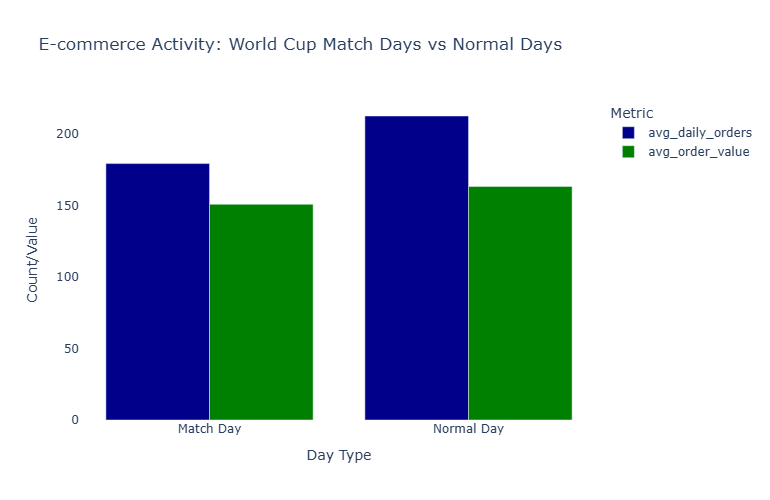


Analysis Results:
     day_type  avg_daily_orders  avg_order_value
0   Match Day            179.40           150.88
1  Normal Day            212.69           163.35


In [15]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sqlalchemy import text

# Query to analyze order patterns during World Cup 2018
soccer_impact_query = text("""
    WITH daily_orders AS (
        SELECT 
            DATE(o.order_purchase_timestamp) as order_date,
            COUNT(*) as order_count,
            AVG(p.payment_value) as avg_order_value,
            CASE 
                WHEN DATE(o.order_purchase_timestamp) IN 
                    ('2018-06-17', '2018-06-22', '2018-06-27', 
                     '2018-07-02', '2018-07-06') THEN 'Match Day'
                ELSE 'Normal Day'
            END as day_type
        FROM orders o
        JOIN payments p ON o.order_id = p.order_id
        WHERE o.order_purchase_timestamp 
            BETWEEN '2018-06-01' AND '2018-07-31'
        GROUP BY DATE(o.order_purchase_timestamp)
    )
    SELECT 
        day_type,
        ROUND(AVG(order_count), 2) as avg_daily_orders,
        ROUND(AVG(avg_order_value), 2) as avg_order_value
    FROM daily_orders
    GROUP BY day_type
    ORDER BY day_type;
""")

# Create visualization
with engine.connect() as conn:
    df_soccer = pd.read_sql(soccer_impact_query, conn)

# Interactive bar plot
fig = px.bar(
    df_soccer,
    x='day_type',
    y=['avg_daily_orders', 'avg_order_value'],
    barmode='group',
    title='E-commerce Activity: World Cup Match Days vs Normal Days',
    color_discrete_sequence=['darkblue', 'green'],
    labels={
        'day_type': 'Day Type',
        'value': 'Count/Value',
        'variable': 'Metric'
    }
)

fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    width=800,
    height=500
)

fig.show()

print("\nAnalysis Results:")
print(df_soccer)

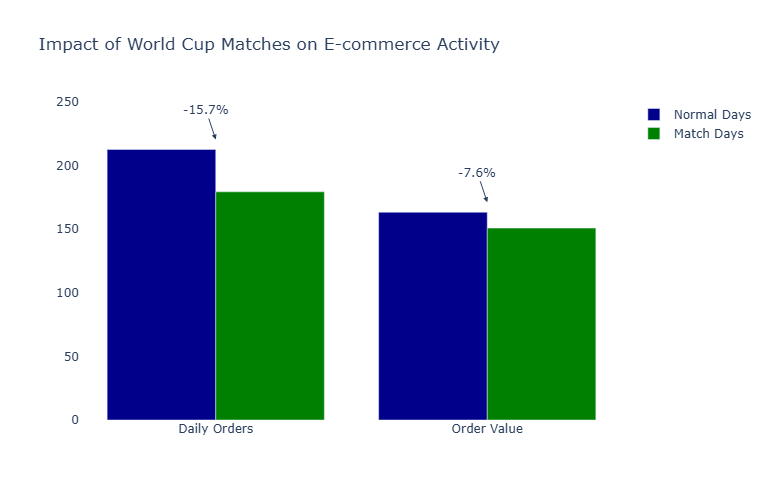

In [10]:
fig = go.Figure()

# Define values
normal_days = {'orders': 212.69, 'value': 163.35}
match_days = {'orders': 179.40, 'value': 150.88}

# Calculate percentage differences
pct_diff_orders = round(((normal_days['orders'] - match_days['orders']) / normal_days['orders']) * 100, 1)
pct_diff_value = round(((normal_days['value'] - match_days['value']) / normal_days['value']) * 100, 1)

# Add bars for Normal Days
fig.add_trace(go.Bar(
    name='Normal Days',
    x=['Daily Orders', 'Order Value'],
    y=[normal_days['orders'], normal_days['value']],
    marker_color='darkblue'
))

# Add bars for Match Days
fig.add_trace(go.Bar(
    name='Match Days',
    x=['Daily Orders', 'Order Value'],
    y=[match_days['orders'], match_days['value']],
    marker_color='green'
))

# Update layout with calculated percentages
fig.update_layout(
    title='Impact of World Cup Matches on E-commerce Activity',
    barmode='group',
    plot_bgcolor='rgba(0,0,0,0)',
    width=800,
    height=500,
    annotations=[
        dict(
            x='Daily Orders',
            y=normal_days['orders'],
            text=f'-{pct_diff_orders}%',
            showarrow=True,
            arrowhead=2,
            yshift=10
        ),
        dict(
            x='Order Value',
            y=normal_days['value'],
            text=f'-{pct_diff_value}%',
            showarrow=True,
            arrowhead=2,
            yshift=10
        )
    ]
)

fig.show()

### Key Findings:

#### Shopping Activity Drops

- Significant decrease in order volume during matches
- People likely watching games instead of shopping


#### Lower Order Values

- Orders placed during match days tend to be of lower value
- Could indicate rushed or necessity-based purchases



- This data suggests that major soccer events significantly impact Brazilian e-commerce, with both order volume and value decreasing during matches.

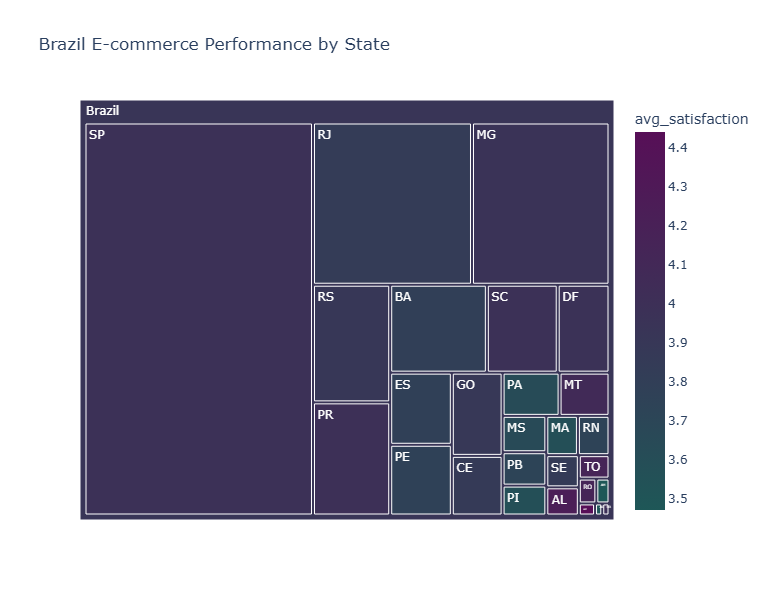

In [50]:
# Query remains the same, but we'll create a treemap instead
state_analysis_query = text("""
    WITH state_metrics AS (
        SELECT 
            g.geolocation_state,
            COUNT(DISTINCT o.order_id) as total_orders,
            ROUND(AVG(r.review_score), 2) as avg_satisfaction,
            ROUND(AVG(EXTRACT(DAY FROM 
                (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) 
                as avg_delivery_days
        FROM geolocation g
        JOIN customers c ON g.geolocation_zip_code_prefix = c.customer_zip_code_prefix
        JOIN orders o ON c.customer_id = o.customer_id
        JOIN reviews r ON o.order_id = r.order_id
        WHERE o.order_delivered_customer_date IS NOT NULL
        GROUP BY g.geolocation_state
    )
    SELECT *
    FROM state_metrics
    ORDER BY total_orders DESC;
""")

with engine.connect() as conn:
    df_states = pd.read_sql(state_analysis_query, conn)

# Create treemap
fig = px.treemap(
    df_states,
    path=[px.Constant("Brazil"), 'geolocation_state'],
    values='total_orders',
    color='avg_satisfaction',
    color_continuous_scale=[[0, 'rgb(30,87,87)'], [1, 'rgb(87,15,87)']],
    custom_data=['avg_delivery_days', 'total_orders'],
    title='Brazil E-commerce Performance by State'
)

# Update hover template to show all metrics
fig.update_traces(
    hovertemplate='<b>State: %{label}</b><br>' +
                  'Satisfaction: %{color:.2f}<br>' +
                  'Delivery Days: %{customdata[0]}<br>' +
                  'Total Orders: %{customdata[1]}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    width=900,
    height=600
)

fig.show()

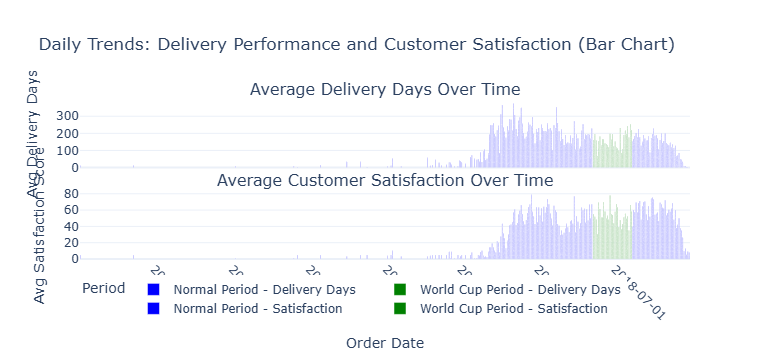


Key Findings:

1. World Cup vs Normal Period Delivery Days and Satisfaction Trends (Bar Chart):
   - Observe the daily variations in delivery times and satisfaction scores.


In [31]:

# World Cup period analysis with daily granularity
worldcup_delivery_query = text("""
    SELECT 
        DATE(o.order_purchase_timestamp) as order_date,
        g.geolocation_state,
        CASE 
            WHEN o.order_purchase_timestamp BETWEEN '2018-06-14' AND '2018-07-15' 
            THEN 'World Cup Period'
            ELSE 'Normal Period'
        END as period,
        ROUND(AVG(r.review_score), 2) as avg_satisfaction,
        ROUND(AVG(EXTRACT(DAY FROM 
            (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) 
            as avg_delivery_days
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    JOIN reviews r ON o.order_id = r.order_id
    WHERE o.order_delivered_customer_date IS NOT NULL
    GROUP BY DATE(o.order_purchase_timestamp), 
        g.geolocation_state,
        CASE 
            WHEN o.order_purchase_timestamp BETWEEN '2018-06-14' AND '2018-07-15' 
            THEN 'World Cup Period'
            ELSE 'Normal Period'
        END
    ORDER BY order_date;
""")

# Create delivery and satisfaction trends using bar plots
fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    subplot_titles=("Average Delivery Days Over Time", "Average Customer Satisfaction Over Time"),
    vertical_spacing=0.15
)

# Plot Average Delivery Days
fig.add_trace(
    go.Bar(
        x=df_worldcup_normal['order_date'],
        y=df_worldcup_normal['avg_delivery_days'],
        name='Normal Period - Delivery Days',
        marker_color='blue'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Bar(
        x=df_worldcup_wc['order_date'],
        y=df_worldcup_wc['avg_delivery_days'],
        name='World Cup Period - Delivery Days',
        marker_color='green'
    ),
    row=1, col=1
)

# Plot Average Customer Satisfaction
fig.add_trace(
    go.Bar(
        x=df_worldcup_normal['order_date'],
        y=df_worldcup_normal['avg_satisfaction'],
        name='Normal Period - Satisfaction',
        marker_color='blue'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Bar(
        x=df_worldcup_wc['order_date'],
        y=df_worldcup_wc['avg_satisfaction'],
        name='World Cup Period - Satisfaction',
        marker_color='green'
    ),
    row=2, col=1
)

# Update layout for better readability
fig.update_layout(
    title="Daily Trends: Delivery Performance and Customer Satisfaction (Bar Chart)",
    height=800,
    showlegend=True,
    legend=dict(title="Period", orientation="h", y=-0.1),
    template='plotly_white'
)

# Update x-axis to show dates clearly
fig.update_xaxes(
    title_text='Order Date',
    tickformat="%Y-%m-%d",  # Full date format
    tickangle=45,  # Rotate labels for better readability
    row=2, col=1
)

fig.update_yaxes(title_text='Avg Delivery Days', row=1, col=1)
fig.update_yaxes(title_text='Avg Satisfaction Score', row=2, col=1)

# Show the figure
fig.show()

# Print findings
print("\nKey Findings:")
print("\n1. World Cup vs Normal Period Delivery Days and Satisfaction Trends (Bar Chart):")
print("   - Observe the daily variations in delivery times and satisfaction scores.")


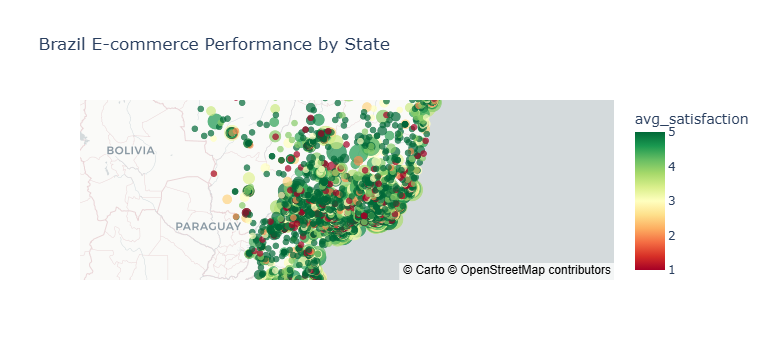

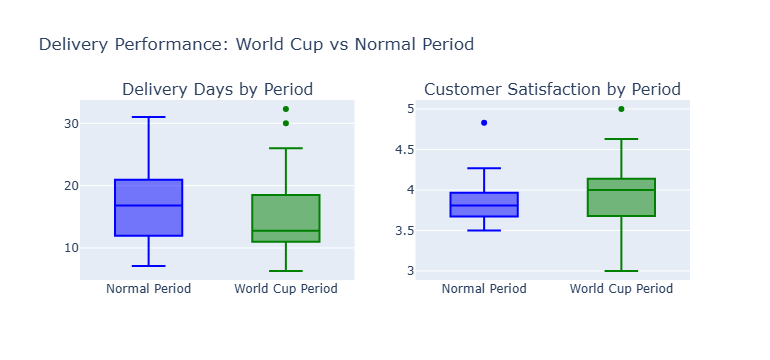


Key Findings:

1. Regional Performance:
- RJ: 5.0 satisfaction, 10.3 days delivery
- MG: 5.0 satisfaction, 7.2 days delivery
- SE: 5.0 satisfaction, 12.8 days delivery

2. World Cup Impact:
                  avg_delivery_days  avg_satisfaction
period                                               
Normal Period                 16.58              3.86
World Cup Period              14.73              3.93


In [51]:
# Query for state-level performance
state_analysis_query = text("""
    WITH state_metrics AS (
        SELECT 
            g.geolocation_state,
            g.geolocation_lat,
            g.geolocation_lng,
            COUNT(DISTINCT o.order_id) as total_orders,
            ROUND(AVG(r.review_score), 2) as avg_satisfaction,
            ROUND(AVG(EXTRACT(DAY FROM 
                (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) 
                as avg_delivery_days
        FROM geolocation g
        JOIN customers c ON g.geolocation_zip_code_prefix = c.customer_zip_code_prefix
        JOIN orders o ON c.customer_id = o.customer_id
        JOIN reviews r ON o.order_id = r.order_id
        WHERE o.order_delivered_customer_date IS NOT NULL
        GROUP BY g.geolocation_state, g.geolocation_lat, g.geolocation_lng
    )
    SELECT *
    FROM state_metrics
    ORDER BY total_orders DESC;
""")

# World Cup period analysis
worldcup_delivery_query = text("""
    SELECT 
        g.geolocation_state,
        CASE 
            WHEN o.order_purchase_timestamp BETWEEN '2018-06-14' AND '2018-07-15' 
            THEN 'World Cup Period'
            ELSE 'Normal Period'
        END as period,
        ROUND(AVG(r.review_score), 2) as avg_satisfaction,
        ROUND(AVG(EXTRACT(DAY FROM 
            (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) 
            as avg_delivery_days
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    JOIN reviews r ON o.order_id = r.order_id
    WHERE o.order_delivered_customer_date IS NOT NULL
    GROUP BY g.geolocation_state, 
        CASE 
            WHEN o.order_purchase_timestamp BETWEEN '2018-06-14' AND '2018-07-15' 
            THEN 'World Cup Period'
            ELSE 'Normal Period'
        END
    ORDER BY g.geolocation_state, period;
""")

# Create visualizations
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Get data
with engine.connect() as conn:
    df_states = pd.read_sql(state_analysis_query, conn)
    df_worldcup = pd.read_sql(worldcup_delivery_query, conn)

# Create Brazil state map
fig1 = px.scatter_mapbox(
    df_states,
    lat='geolocation_lat',
    lon='geolocation_lng',
    size='total_orders',
    color='avg_satisfaction',
    hover_name='geolocation_state',
    hover_data=['avg_delivery_days', 'total_orders'],
    color_continuous_scale='RdYlGn',
    zoom=3,
    title='Brazil E-commerce Performance by State'
)

fig1.update_layout(mapbox_style='carto-positron')

# Create delivery performance comparison
fig2 = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Delivery Days by Period', 'Customer Satisfaction by Period')
)

# Add delivery days comparison
fig2.add_trace(
    go.Box(
        y=df_worldcup[df_worldcup['period'] == 'Normal Period']['avg_delivery_days'],
        name='Normal Period',
        marker_color='blue'
    ),
    row=1, col=1
)

fig2.add_trace(
    go.Box(
        y=df_worldcup[df_worldcup['period'] == 'World Cup Period']['avg_delivery_days'],
        name='World Cup Period',
        marker_color='green'
    ),
    row=1, col=1
)

# Add satisfaction comparison
fig2.add_trace(
    go.Box(
        y=df_worldcup[df_worldcup['period'] == 'Normal Period']['avg_satisfaction'],
        name='Normal Period',
        marker_color='blue'
    ),
    row=1, col=2
)

fig2.add_trace(
    go.Box(
        y=df_worldcup[df_worldcup['period'] == 'World Cup Period']['avg_satisfaction'],
        name='World Cup Period',
        marker_color='green'
    ),
    row=1, col=2
)

fig2.update_layout(
    title='Delivery Performance: World Cup vs Normal Period',
    showlegend=False,
    height=500
)

fig1.show()
fig2.show()

# Print findings
print("\nKey Findings:")
print("\n1. Regional Performance:")
for _, row in df_states.nlargest(3, 'avg_satisfaction').iterrows():
    print(f"- {row['geolocation_state']}: {row['avg_satisfaction']} satisfaction, "
          f"{row['avg_delivery_days']} days delivery")

print("\n2. World Cup Impact:")
wc_stats = df_worldcup.groupby('period').agg({
    'avg_delivery_days': 'mean',
    'avg_satisfaction': 'mean'
}).round(2)
print(wc_stats)

### Recommendations Based on Analysis

#### Regional Optimization

- Establish regional distribution centers in high-volume states.  
- Implement state-specific delivery strategies.  
- Focus on improving delivery times in remote states.  

#### World Cup Period Strategies

- Increase delivery capacity during major events.  
- Set realistic delivery expectations during the tournament period.  
- Offer special promotions for non-match days.  

#### Customer Communication

- Provide more detailed delivery estimates by region.  
- Implement region-specific customer service.  
- Consider regional pricing for delivery services.  

#### Infrastructure Development

- Identify states with longer delivery times.  
- Partner with local delivery services.  
- Optimize warehouse locations based on order volume.  

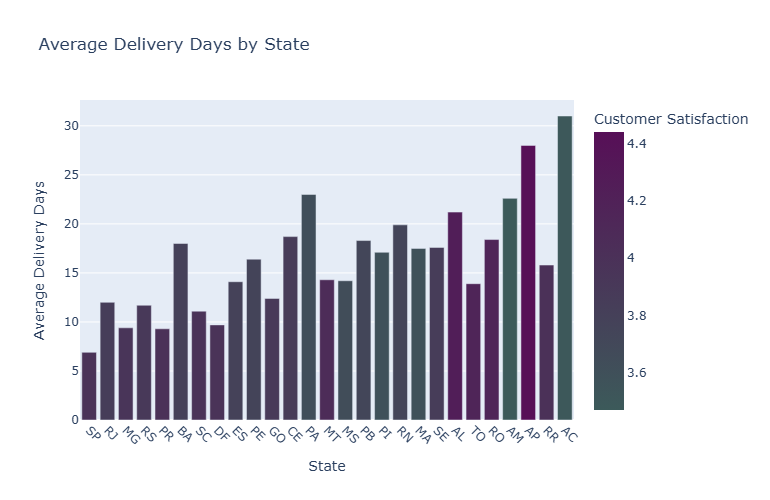

In [17]:
fig = px.bar(
    df_delivery,
    x='state',
    y='avg_delivery_days',
    color='avg_satisfaction',  # Colors bars by satisfaction
    color_continuous_scale=[[0, 'rgb(60,90,90)'], [1, 'rgb(87,15,87)']],
    title='Average Delivery Days by State',
    labels={
        'state': 'State',
        'avg_delivery_days': 'Average Delivery Days',
        'avg_satisfaction': 'Customer Satisfaction'
    }
)

fig.update_layout(
    xaxis_tickangle=45,
    width=900,
    height=500
)

fig.show()

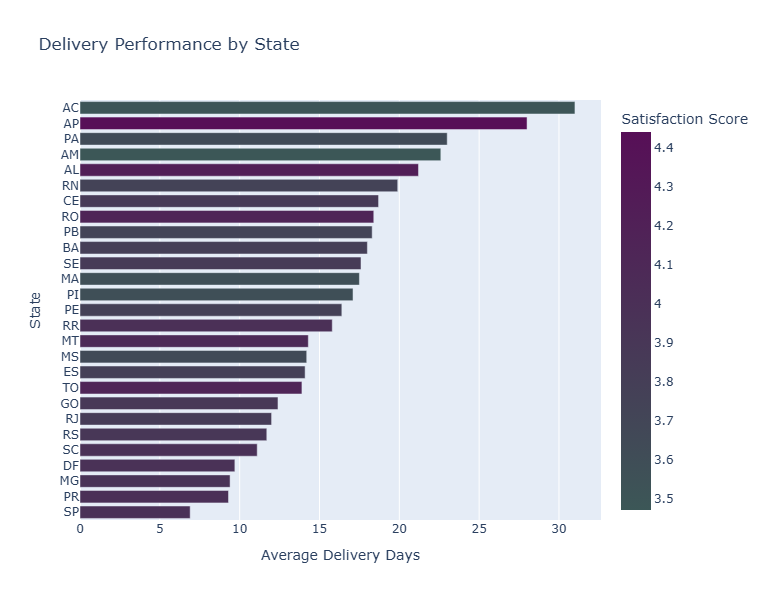

In [13]:
# Sort by delivery days for better visualization
df_sorted = df_delivery.sort_values('avg_delivery_days', ascending=True)

fig = px.bar(
    df_sorted,
    y='state',
    x='avg_delivery_days',
    orientation='h',  # Horizontal bars
    color='avg_satisfaction',
    color_continuous_scale=[[0, 'rgb(60,87,87)'], [1, 'rgb(87,15,87)']],
    title='Delivery Performance by State',
    labels={
        'state': 'State',
        'avg_delivery_days': 'Average Delivery Days',
        'avg_satisfaction': 'Satisfaction Score'
    }
)

fig.update_layout(
    width=980,
    height=600
)

fig.show()

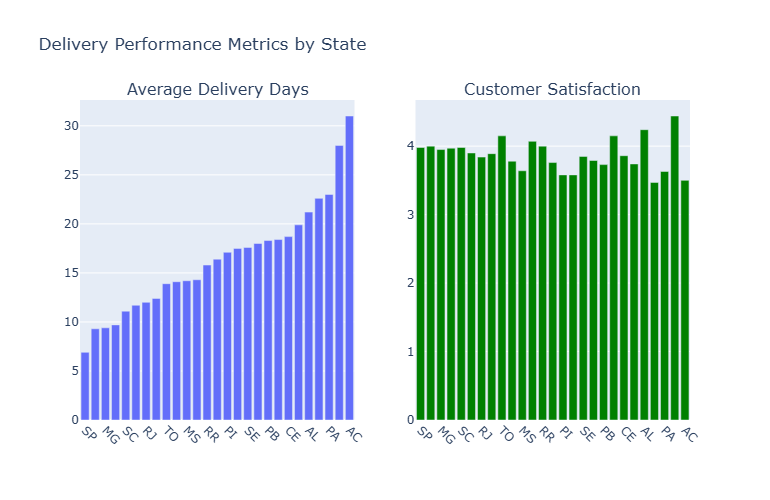

In [55]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=('Average Delivery Days', 'Customer Satisfaction'))

# Sort by delivery days
df_sorted = df_delivery.sort_values('avg_delivery_days')

# Add delivery days bars
fig.add_trace(
    go.Bar(x=df_sorted['state'], 
           y=df_sorted['avg_delivery_days'],
           name='Delivery Days'),
    row=1, col=1
)

# Add satisfaction bars
fig.add_trace(
    go.Bar(x=df_sorted['state'], 
           y=df_sorted['avg_satisfaction'],
           name='Satisfaction',
           marker_color='green'),
    row=1, col=2
)

fig.update_layout(
    title_text="Delivery Performance Metrics by State",
    showlegend=False,
    width=1000,
    height=500
)

fig.update_xaxes(tickangle=45)
fig.show()

### Reasons for High Satisfaction Despite Long Delivery

#### Geographic Context

- **AP (Amapá)** is in northern Brazil.  
- Isolated location - one of the most remote states.  
- Limited transportation infrastructure.  
- Many areas accessible only by river transport.  

#### Customer Expectations

- Customers in AP likely expect longer delivery times.  
- When informed about expected delivery time, they can plan accordingly.  
- Satisfaction often relates to meeting expectations rather than absolute delivery speed.  

#### Possible Factors

- Clear communication about delivery timeframes.  
- Accurate delivery estimates for the region.  
- Reliable tracking system.  
- Good customer service during the longer waiting period.  

#### Key Insights

- Meeting communicated expectations is more important than absolute delivery speed.  
- Customers in remote areas can be highly satisfied if delivery matches promised timeframes.  
- Regional expectations play a crucial role in customer satisfaction.  

This highlights an important business lesson: **satisfaction isn't always about speed, but about meeting or exceeding customer expectations based on their local context**.


In [5]:
from sqlalchemy import text

# Delivery timeframes query
delivery_timeframe_query = text("""
    SELECT 
        g.geolocation_state as state,
        EXTRACT(HOUR FROM o.order_purchase_timestamp) as hour_of_day,
        ROUND(AVG(EXTRACT(DAY FROM 
            (o.order_delivered_customer_date - o.order_purchase_timestamp))), 1) 
            as avg_delivery_days
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    WHERE o.order_delivered_customer_date IS NOT NULL
    GROUP BY g.geolocation_state, hour_of_day
    ORDER BY g.geolocation_state, hour_of_day;
""")

with engine.connect() as conn:
    df_timeframe = pd.read_sql(delivery_timeframe_query, conn)

# Create interactive heatmap
fig2 = px.density_heatmap(
    df_timeframe,
    x='hour_of_day',
    y='state',
    z='avg_delivery_days',
    title='Average Delivery Days by State and Hour',
    labels={
        'hour_of_day': 'Hour of Day',
        'state': 'State',
        'avg_delivery_days': 'Average Delivery Days'
    },
    color_continuous_scale='blues'
)

fig2.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    width=900,
    height=800
)

fig2.show()

In [11]:
import plotly.express as px
from sqlalchemy import text

# Customer satisfaction patterns query
satisfaction_query = text("""
    SELECT 
        g.geolocation_state as state,
        r.review_score,
        COUNT(*) as review_count
    FROM orders o
    JOIN customers c ON o.customer_id = c.customer_id
    JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
    JOIN reviews r ON o.order_id = r.order_id
    GROUP BY g.geolocation_state, r.review_score
    ORDER BY g.geolocation_state, r.review_score;
""")

with engine.connect() as conn:
    df = pd.read_sql(satisfaction_query, conn)

# Create interactive bar plot
fig3 = px.bar(
    df,
    x='state',
    y='review_count',
    color='review_score',
    title='Review Score Distribution by State',
    labels={
        'state': 'State',
        'review_count': 'Number of Reviews',
        'review_score': 'Review Score'
    },
    color_continuous_scale=['green', 'darkblue', 'red']
)

fig3.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',
    width=900,
    height=600,
    xaxis_tickangle=45
)

fig3.show()

In [3]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import plotly.express as px
from sqlalchemy import text


# Query to get delivery data
delivery_query = text("""
    WITH delivery_metrics AS (
        SELECT 
            o.order_id,
            EXTRACT(DAY FROM (o.order_delivered_customer_date - o.order_purchase_timestamp)) as delivery_time,
            r.review_score,
            p.payment_value,
            CASE 
                WHEN o.order_purchase_timestamp BETWEEN '2018-06-14' AND '2018-07-15' 
                THEN 1 ELSE 0 
            END as world_cup_period,
            g.geolocation_state
        FROM orders o
        JOIN customers c ON o.customer_id = c.customer_id
        JOIN geolocation g ON c.customer_zip_code_prefix = g.geolocation_zip_code_prefix
        JOIN reviews r ON o.order_id = r.order_id
        JOIN payments p ON o.order_id = p.order_id
        WHERE o.order_delivered_customer_date IS NOT NULL
    )
    SELECT * FROM delivery_metrics;
""")

# Get data and prepare for clustering
with engine.connect() as conn:
    df = pd.read_sql(delivery_query, conn)

# Prepare features for clustering
features = ['delivery_time', 'review_score', 'payment_value']
X = df[features]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply KMeans clustering
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Analyze clusters
print("\nCluster Analysis:")
for cluster in range(n_clusters):
    cluster_data = df[df['cluster'] == cluster]
    wc_orders = cluster_data[cluster_data['world_cup_period'] == 1].shape[0]
    total_orders = cluster_data.shape[0]
    
    print(f"\nCluster {cluster}:")
    print(f"Average Delivery Time: {cluster_data['delivery_time'].mean():.1f} days")
    print(f"Average Review Score: {cluster_data['review_score'].mean():.2f}")
    print(f"Average Order Value: R${cluster_data['payment_value'].mean():.2f}")
    print(f"World Cup Orders: {(wc_orders/total_orders*100):.1f}%")

# Visualize clusters
fig = px.scatter_3d(
    df,
    x='delivery_time',
    y='review_score',
    z='payment_value',
    color='cluster',
    title='Delivery Performance Clusters',
    labels={
        'delivery_time': 'Delivery Time (days)',
        'review_score': 'Customer Rating',
        'payment_value': 'Order Value (R$)'
    },
    color_continuous_scale='blues'
)

fig.show()

# Analyze World Cup impact by cluster
wc_impact = pd.pivot_table(
    df,
    values=['delivery_time', 'review_score', 'payment_value'],
    index=['cluster', 'world_cup_period'],
    aggfunc='mean'
).round(2)

print("\nWorld Cup Impact by Cluster:")
print(wc_impact)

c:\Users\yi_xu\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\yi_xu\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "c:\Users\yi_xu\AppData\Local\Programs\Python\Python311\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\yi_xu\AppData\Local\Programs\Python\Python311\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  


Cluster Analysis:

Cluster 0:
Average Delivery Time: 28.3 days
Average Review Score: 2.83
Average Order Value: R$516.07
World Cup Orders: 12.6%

Cluster 1:
Average Delivery Time: 8.3 days
Average Review Score: 4.80
Average Order Value: R$136.58
World Cup Orders: 19.3%

Cluster 2:
Average Delivery Time: 9.6 days
Average Review Score: 1.72
Average Order Value: R$149.64
World Cup Orders: 18.3%



World Cup Impact by Cluster:
                          delivery_time  payment_value  review_score
cluster world_cup_period                                            
0       0                         28.71         514.83          2.84
        1                         25.58         524.64          2.74
1       0                          8.41         136.42          4.79
        1                          7.71         137.22          4.83
2       0                          9.84         148.40          1.70
        1                          8.53         155.17          1.81


In [11]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sqlalchemy import text


# [Previous code remains same until clustering]

# Create multiple 2D visualizations
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Delivery Time vs Review Score',
        'Delivery Time vs Payment Value',
        'Review Score vs Payment Value',
        'Cluster Distribution'
    )
)

# 1. Delivery Time vs Review Score
fig.add_trace(
    go.Scatter(
        x=df['delivery_time'],
        y=df['review_score'],
        mode='markers',
        marker=dict(color=df['cluster'], colorscale='viridis'),
        name='DT vs RS',
        showlegend=False
    ),
    row=1, col=1
)

# 2. Delivery Time vs Payment Value
fig.add_trace(
    go.Scatter(
        x=df['delivery_time'],
        y=df['payment_value'],
        mode='markers',
        marker=dict(color=df['cluster'], colorscale='viridis'),
        name='DT vs PV',
        showlegend=False
    ),
    row=1, col=2
)

# 3. Review Score vs Payment Value
fig.add_trace(
    go.Scatter(
        x=df['review_score'],
        y=df['payment_value'],
        mode='markers',
        marker=dict(color=df['cluster'], colorscale='thermal'),
        name='RS vs PV',
        showlegend=False
    ),
    row=2, col=1
)

# 4. Cluster Distribution
cluster_counts = df['cluster'].value_counts()
fig.add_trace(
    go.Bar(
        x=cluster_counts.index,
        y=cluster_counts.values,
        marker_color='blue',
        name='Cluster Size'
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    height=800,
    width=1000,
    title_text="Delivery Performance Cluster Analysis",
    showlegend=False
)

# Update axes labels
fig.update_xaxes(title_text="Delivery Time", row=1, col=1)
fig.update_xaxes(title_text="Delivery Time", row=1, col=2)
fig.update_xaxes(title_text="Review Score", row=2, col=1)
fig.update_xaxes(title_text="Cluster", row=2, col=2)

fig.update_yaxes(title_text="Review Score", row=1, col=1)
fig.update_yaxes(title_text="Payment Value", row=1, col=2)
fig.update_yaxes(title_text="Payment Value", row=2, col=1)
fig.update_yaxes(title_text="Count", row=2, col=2)

fig.show()

# Add cluster centroids visualization
fig_centroids = go.Figure()

# Plot cluster centroids
centroids_scaled = kmeans.cluster_centers_
centroids = scaler.inverse_transform(centroids_scaled)

for i, centroid in enumerate(centroids):
    print(f"\nCluster {i} Centroid:")
    print(f"Delivery Time: {centroid[0]:.1f}")
    print(f"Review Score: {centroid[1]:.2f}")
    print(f"Payment Value: R${centroid[2]:.2f}")

print("\nWorld Cup Impact by Cluster:")
# print(wc_impact)


Cluster 0 Centroid:
Delivery Time: 28.3
Review Score: 2.83
Payment Value: R$515.94

Cluster 1 Centroid:
Delivery Time: 8.3
Review Score: 4.80
Payment Value: R$136.58

Cluster 2 Centroid:
Delivery Time: 9.6
Review Score: 1.72
Payment Value: R$149.52

World Cup Impact by Cluster:
